# Style Transfer of MRI Images using CycleGAN


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


- <b>Objective:</b> To generate T2 styled MRI images from T1 styled MRI images and T1 styled MRI images using T2 styled images.
- <b>Solution approach:</b> Use of CycleGAN (cyclic generative adversarial neural network) for the T1 to T2 and vice-versa style transfer and U-Net based segmentation.

<table align = "left">
<p><b>MRI image attributes</b></p>

<tr>
<th align = "right">Type</th>
<th align = "center">T1 highlight style</th>
<th align = "center">T2 highlight style</th>
</tr>

<tr>
<td align = "right">Water</td>
<td align = "center">Dark</td>
<td align = "center">Very Bright</td>
</tr>

<tr>
<td align = "right">Fat</td>
<td align = "center">Very Bright</td>
<td align = "center">Dark</td>
</tr>

<tr>
<td align = "right">Bone</td>
<td align = "center">Dark</td>
<td align = "center">Dark</td>
</tr>

<tr>
<td align = "right">Muscle</td>
<td align = "center">Intermediate</td>
<td align = "center">Dark</td>
</tr>

<tr>
<td align = "right">Tumours</td>
<td align = "center">Intermediate</td>
<td align = "center">Bright</td>
</tr>

</table>

<b>Project sequence:</b>
1. Initialization
2. Data Loading and Visualization
3. Data Preprocessing
4. Model Building
5. Model Training
6. Visualizing Style Transfer through a GIF
7. Making Predictions
8. Model Deployment

# 1. Initialization
1a. Importing Libraries <br>
1b. Setting project directory <br>

## 1a. Importing Libraries

In [ ]:
# Importing required libraries
import numpy as np
import tensorflow as tf

import matplotlib.pyplot as plt
%matplotlib inline
import imageio
from skimage.transform import resize
from keras.utils.vis_utils import plot_model

import os
import shutil
from glob import glob

In [ ]:
# Installing tensorflow 
!pip install git+https://github.com/tensorflow/docs

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Cloning https://github.com/tensorflow/docs to /tmp/pip-req-build-fhi8e9s0
  Running command git clone -q https://github.com/tensorflow/docs /tmp/pip-req-build-fhi8e9s0
  Created wheel for tensorflow-docs: filename=tensorflow_docs-0.0.0.dev0-py3-none-any.whl size=184468 sha256=f546437d39384ecd51ce5aeb892347de8da3a3f289089ab03eccd13984b8d112
  Stored in directory: /tmp/pip-ephem-wheel-cache-zxdr3y65/wheels/3b/ee/a2/ab4d36a9a4af495bcb936f3e849d4b497b65fa40548a68d6c3
Successfully built tensorflow-docs


## 1b. Setting project directory
This project is run on Google Colab

In [ ]:
# Mounting google drive - required if code is run on Google Colab
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# Defining file paths

# Project folder: /content/drive/MyDrive/Colab Notebooks/Style_Transfer_Project/

# Directory for storing files during model building and training: 
# /content/drive/MyDrive/Colab Notebooks/Style_Transfer_Project/Model_Training/

In [ ]:
# Checking the current working directory
!pwd

/content


In [ ]:
# Defining target path
target_path = '/content/drive/MyDrive/Colab Notebooks/Style_Transfer_Project/Model_Training/'

# Defining version folder
version_folder = 'V5D' #version of experiment

In [ ]:
# Changing the working directory to target_path (Model_Training folder)
os.chdir(target_path)

# Checking working directory after change
!pwd

/content/drive/MyDrive/Colab Notebooks/Style_Transfer_Project/Model_Training


In [ ]:
# Changing working directory to version folder
if os.path.isdir(version_folder) == True:
  shutil.rmtree(os.path.join(target_path, version_folder))
  os.mkdir(version_folder)
  os.chdir(os.path.join(target_path, version_folder))

else:
  os.mkdir(version_folder)
  os.chdir(os.path.join(target_path, version_folder))

# Checking the current working directory after change
!pwd

/content/drive/MyDrive/Colab Notebooks/Style_Transfer_Project/Model_Training/V5D


In [ ]:
!pwd

/content/drive/MyDrive/Colab Notebooks/Style_Transfer_Project/Model_Training/V5D


# 2. Data Loading and Visualization
2a. Data Loading<br>
2b. Data Visualization<br>

## 2a. Data Loading

In [ ]:
# Creating a function to load images from the specified folder path
def image_loader(folderpath):
  images_array = []
  for filepath in glob(folderpath + '*'):
    img = imageio.imread(filepath)
    images_array.append(img)
  images_array = np.array(images_array)
  return images_array

In [ ]:
# Defining path for loading T1 and T2 images
T1_train_path = '/content/drive/MyDrive/Colab Notebooks/Style_Transfer_Project/Dataset/T1train/' #T1 images folderpath
T2_train_path = '/content/drive/MyDrive/Colab Notebooks/Style_Transfer_Project/Dataset/T2train/' #T2 images folderpath
T1_test_path = '/content/drive/MyDrive/Colab Notebooks/Style_Transfer_Project/Dataset/t1test/' #T1 images folderpath
T2_test_path = '/content/drive/MyDrive/Colab Notebooks/Style_Transfer_Project/Dataset/t2test/' #T2 images folderpath

In [ ]:
# Loading images
T1_trimages = image_loader(T1_train_path) #Loading T1 train images
T1_teimages = image_loader(T1_test_path) #Loading T1 train images
T2_trimages = image_loader(T2_train_path) #Loading T2 train images
T2_teimages = image_loader(T2_test_path) #Loading T2 test images


In [ ]:
# Checking shapes of the loaded image datasets
print('Shape of T1 training images: ', T1_trimages.shape)
print('Shape of T2 training images: ', T2_trimages.shape)
print('Shape of T1 testing images: ', T1_teimages.shape)
print('Shape of T2 testing images: ', T2_teimages.shape)

Shape of T1 training images:  (33, 217, 181)
Shape of T2 training images:  (36, 217, 181)
Shape of T1 testing images:  (9, 217, 181)
Shape of T2 testing images:  (9, 217, 181)


In [ ]:
# Observations:
# There are 43 T1-weighted images and 46 T2-weighted images
# Image sets are unpaired
# All images are of size 217 x 181
# All images are single channel grayscale images

## 2b. Data Visualization

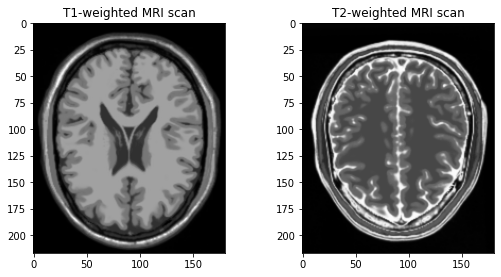

In [ ]:
# Visualizing T1 and T2 weighted images
fig, ax = plt.subplots(1, 2, figsize = [8, 8])

fig.subplots_adjust(left = 0.1, 
                    bottom = 0.1, 
                    right = 0.9, 
                    top = 0.9, 
                    wspace = 0.4, 
                    hspace = 0.4)

#T1-weighted image
ax[0].set_title('T1-weighted MRI scan')
ax[0].imshow(T1_trimages[0], cmap = 'gray')

#T2-weighted image
ax[1].set_title('T2-weighted MRI scan')
ax[1].imshow(T2_trimages[0], cmap = 'gray')

plt.show()

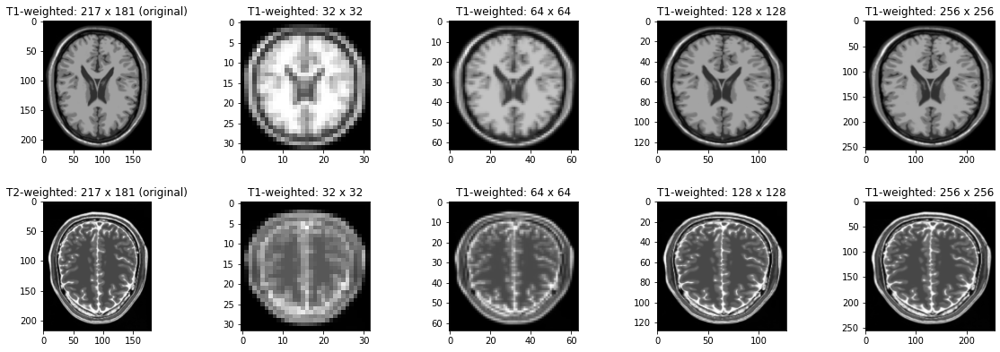

In [ ]:
# Visualizing T1 and T2 weighted images in resized shapes
fig, ax = plt.subplots(2, 5, figsize = [16, 16])

fig.subplots_adjust(left = 0.001, 
                    bottom = 0.1, 
                    right = 0.95, 
                    top = 0.4, 
                    wspace = 0.4, 
                    hspace = 0.4)

#T1-weighted images
ax[0, 0].set_title('T1-weighted: 217 x 181 (original)')
ax[0, 0].imshow(T1_trimages[0], cmap = 'gray')

ax[0, 1].set_title('T1-weighted: 32 x 32')
ax[0, 1].imshow(resize(T1_trimages[0], (32, 32)), cmap = 'gray')

ax[0, 2].set_title('T1-weighted: 64 x 64')
ax[0, 2].imshow(resize(T1_trimages[0], (64, 64)), cmap = 'gray')

ax[0, 3].set_title('T1-weighted: 128 x 128')
ax[0, 3].imshow(resize(T1_trimages[0], (128, 128)), cmap = 'gray')

ax[0, 4].set_title('T1-weighted: 256 x 256')
ax[0, 4].imshow(resize(T1_trimages[0], (256, 256)), cmap = 'gray')

#T2-weighted images
ax[1, 0].set_title('T2-weighted: 217 x 181 (original)')
ax[1, 0].imshow(T2_trimages[0], cmap = 'gray')

ax[1, 1].set_title('T1-weighted: 32 x 32')
ax[1, 1].imshow(resize(T2_trimages[0], (32, 32)), cmap = 'gray')

ax[1, 2].set_title('T1-weighted: 64 x 64')
ax[1, 2].imshow(resize(T2_trimages[0], (64, 64)), cmap = 'gray')

ax[1, 3].set_title('T1-weighted: 128 x 128')
ax[1, 3].imshow(resize(T2_trimages[0], (128, 128)), cmap = 'gray')

ax[1, 4].set_title('T1-weighted: 256 x 256')
ax[1, 4].imshow(resize(T2_trimages[0], (256, 256)), cmap = 'gray')

plt.show()

In [ ]:
# Observations:
# A MRI image of brain naturally has more height than the width
# If this rectangular format is to be resized to a square size format:
# 32x32 size leads to information loss
# 64x64 size is slightly better in capturing information
# 128x128 and 256x256 seem to capture better image information

# 3. Data Preprocessing
3a. Image Normalization<br>
3b. Image Resizing <br>
3c. Image Reshaping <br>
3d. Shuffling and Batching images <br>

## 3a. Image Normalization

In [ ]:
# Normalizing images between -1 and +1

# Normalizing T1 images
T1_trimages_norm = (T1_trimages/127.5) - 1.0
T1_teimages_norm = (T1_teimages/127.5) - 1.0
# Normalizing T2 images
T2_trimages_norm = (T2_trimages/127.5) - 1.0
T2_teimages_norm = (T2_teimages/127.5) - 1.0

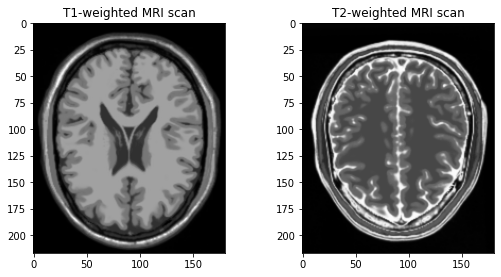

In [ ]:
# Visualizing T1 and T2 weighted images - after normalization
fig, ax = plt.subplots(1, 2, figsize = [8, 8])

fig.subplots_adjust(left = 0.1, 
                    bottom = 0.1, 
                    right = 0.9, 
                    top = 0.9, 
                    wspace = 0.4, 
                    hspace = 0.4)

#T1-weighted image - after normalization
ax[0].set_title('T1-weighted MRI scan')
ax[0].imshow(T1_trimages[0], cmap = 'gray')

#T2-weighted image - after normalization
ax[1].set_title('T2-weighted MRI scan')
ax[1].imshow(T2_trimages[0], cmap = 'gray')

plt.show()

## 3b. Image Resizing

In [ ]:
# Defining a resize dimension to resize images

#Resize to 256x256 - captures more image information, power of 2 - eases computation
resize_dim_1 = 256 
resize_dim_2 = 256

In [ ]:
# Resizing T1 images
#Defining a buffer
T1_images_norm_resize = np.zeros((T1_trimages_norm.shape[0], 
                                  resize_dim_1, resize_dim_2))
T1_images_tenorm_resize = np.zeros((T1_teimages_norm.shape[0], 
                                  resize_dim_1, resize_dim_2))


#Resizing images and assigning them to buffer
for index, img in enumerate(T1_trimages_norm):
  T1_images_norm_resize[index, :, :] = resize(img, (resize_dim_1, resize_dim_2))

#Resizing images and assigning them to buffer
for index, img in enumerate(T1_teimages_norm):
  T1_images_norm_resize[index, :, :] = resize(img, (resize_dim_1, resize_dim_2))

#Checking shape of the resized image array
T1_images_norm_resize.shape



(33, 256, 256)

In [ ]:
# Resizing T2 images
#Defining a buffer
T2_images_norm_resize = np.zeros((T2_trimages_norm.shape[0], 
                                  resize_dim_1, resize_dim_2))
T2_images_tenorm_resize = np.zeros((T2_teimages_norm.shape[0], 
                                  resize_dim_1, resize_dim_2))


#Resizing images and assigning them to buffer
for index, img in enumerate(T2_trimages_norm):
  T2_images_norm_resize[index, :, :] = resize(img, (resize_dim_1, resize_dim_2))

#Resizing images and assigning them to buffer
for index, img in enumerate(T2_teimages_norm):
  T2_images_norm_resize[index, :, :] = resize(img, (resize_dim_1, resize_dim_2))

#Checking shape of the resized image array
T2_images_norm_resize.shape


(36, 256, 256)

## 3c. Image Reshaping

In [ ]:
# Reshaping image arrays to add channel 1 to make them
# compatible with tensorflow/CNN processing

In [ ]:
# Reshaping T1 images
T1_images_norm_resize_reshape = T1_images_norm_resize.reshape(T1_images_norm_resize.shape[0],
                                                              resize_dim_1, resize_dim_2, 1).astype('float32')

#Checking image array shape after reshaping
T1_images_norm_resize_reshape.shape

T1_images_tenorm_resize_reshape = T1_images_tenorm_resize.reshape(T1_images_tenorm_resize.shape[0],
                                                              resize_dim_1, resize_dim_2, 1).astype('float32')

#Checking image array shape after reshaping
T1_images_norm_resize_reshape.shape



(33, 256, 256, 1)

In [ ]:
# Reshaping T2 images
T2_images_norm_resize_reshape = T2_images_norm_resize.reshape(T2_images_norm_resize.shape[0],
                                                              resize_dim_1, resize_dim_2, 1).astype('float32')

T2_images_tenorm_resize_reshape = T2_images_tenorm_resize.reshape(T2_images_tenorm_resize.shape[0],
                                                              resize_dim_1, resize_dim_2, 1).astype('float32')

#Checking image array shape after reshaping
T2_images_tenorm_resize_reshape.shape

(9, 256, 256, 1)

## 3d. Shuffling and Batching Images

In [ ]:
# Declaring batch size
batch_size = 2

In [ ]:
# Shuffling and batching images and storing them as train datasets

#Converting format to tensorflow dataset
T1_train = tf.data.Dataset.from_tensor_slices(T1_images_norm_resize_reshape)
T2_train = tf.data.Dataset.from_tensor_slices(T2_images_norm_resize_reshape)

#Shuffling images in datasets
T1_train = T1_train.shuffle(T1_images_norm_resize_reshape.shape[0], seed = 42)
T2_train = T2_train.shuffle(T2_images_norm_resize_reshape.shape[0], seed = 42)

#Batching images
T1_train = T1_train.batch(batch_size)
T2_train = T2_train.batch(batch_size)

# Shuffling and batching images and storing them as train datasets

#Converting format to tensorflow dataset
T1_test = tf.data.Dataset.from_tensor_slices(T1_images_tenorm_resize_reshape)
T2_test = tf.data.Dataset.from_tensor_slices(T2_images_tenorm_resize_reshape)

#Shuffling images in datasets
T1_test = T1_test.shuffle(T1_images_tenorm_resize_reshape.shape[0], seed = 42)
T2_test = T2_test.shuffle(T2_images_tenorm_resize_reshape.shape[0], seed = 42)

#Batching images
T1_test = T1_test.batch(batch_size)
T2_test = T2_test.batch(batch_size)

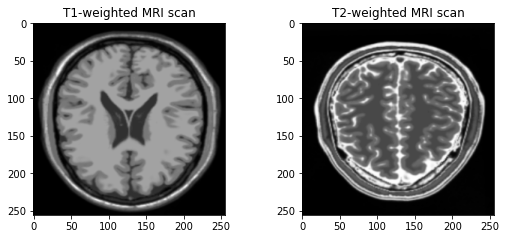

In [ ]:
# Visualizing a sample of preprocessed data/images

sample_T1_train = next(iter(T1_train))
sample_T2_train = next(iter(T2_train))
sample_T1_test = next(iter(T1_test))
sample_T2_test = next(iter(T2_test))

fig, ax = plt.subplots(1, 2, figsize = [8, 8])

fig.subplots_adjust(left = 0.1, 
                    bottom = 0.1, 
                    right = 0.9, 
                    top = 0.9, 
                    wspace = 0.4, 
                    hspace = 0.4)
#T1-weighted image
ax[0].set_title('T1-weighted MRI scan')
ax[0].imshow(sample_T1_train[0].numpy()[:, :, 0], cmap = 'gray')

#T2-weighted image
ax[1].set_title('T2-weighted MRI scan')
ax[1].imshow(sample_T2_train[0].numpy()[:, :, 0], cmap = 'gray')





plt.show()

In [ ]:
# Data is now preprocessed
# Preprocessed T1 and T2 images are stored in T1_train and T2_train

# 4. Model Building
4a. Instance Normalization <br>
4b. Downsampling <br>
4c. Upsampling <br>
4d. Generator Building using Unet <br>
4e. Discriminator Building <br>

In [ ]:
# Generator G: T1 to T2 (domain X to Y)
# Generator F: T2 to T1 (domain Y to X)
# Discriminator X: in domain X (T1)
# Discriminator Y: in domain Y (T2)

## 4a. Instance Normalization

In [ ]:
# Creating a class for instance normalization

class InstanceNormalization(tf.keras.layers.Layer):
  #Initializing objects
  def __init__(self, epsilon = 0.5):
    #calling parent's init
    super(InstanceNormalization, self).__init__()
    self.epsilon = epsilon

    def build(self, input_shape):
      #Sigma: scale
      self.scale = self.add_weight(
          name = 'scale', 
          shape = input_shape[-1:], 
          initializer = tf.random_normal_initializer(0., 0.02), 
          trainable = True)
      
      #Mu: offset
      self.offset = self.add_weight(
          name = 'offset', 
          shape = input_shape[-1:], 
          initializer = 'zeros', 
          trainable = True)
      
      def call(self, x):
        #Compute Mean and Variance, Axes = [1,2] ensures instance normalization
        mean, variance = tf.nn.moments(x, axes = [1,2], keepdims = True)
        inv = tf.math.rsqrt(variance + self.epsilon)
        normalized = (x - mean) * inv
        return self.scale * normalized + self.offset

## 4b. Downsampling

In [ ]:
# Performed using Convolution
# Leads to reduction in image dimensions, and increase in channels

In [ ]:
# Creating a function for downsampling

def downsample(filters, size, apply_norm = True):
  initializer = tf.random_normal_initializer(0. , 0.02)
  result = tf.keras.Sequential()
  
  #Adding Conv2D layer
  result.add(tf.keras.layers.Conv2D(filters, 
                                    size, 
                                    strides = 2, #Stride is the number of pixels shifts over the input matrix
                                    padding = 'same', #output size is same as input size
                                    kernel_initializer = initializer, 
                                    use_bias = False))
  #Adding Normalization layer
  if apply_norm:
    result.add(InstanceNormalization())

  #Adding Leaky ReLU activation
  result.add(tf.keras.layers.LeakyReLU())
  return result

## 4c. Upsampling

In [ ]:
# Performed using Transposed Convolution
# Dimensions of image increases, number of channels reduces

In [ ]:
# Creating a function for upsampling

def upsample(filters, size, apply_dropout = False):
  initializer = tf.random_normal_initializer(0. , 0.02)
  result = tf.keras.Sequential()

  #Adding Transposed Conv2D layer
  result.add(tf.keras.layers.Conv2DTranspose(filters, 
                                             size, 
                                             strides = 2, 
                                             padding = 'same', #output size is same as input size
                                             kernel_initializer = initializer, 
                                             use_bias = False))
  
  #Adding dropout layer
  if apply_dropout:
    result.add(tf.keras.layers.Dropout(0.5))

  #Adding Relu activation layer
  result.add(tf.keras.layers.ReLU())
  return result


## 4d. Generator Building using Unet

In [ ]:
# Unet Generator is a combination of convolution and transposed convolution
# Convolution for downsampling
# Transposed Convolution for upsampling

In [ ]:
# Defining a function for Unet generator

def unet_generator():
  #Downsampling
  down_stack = [
                downsample(64, 4, False), #I/P: (bs, 256, 256, 1), bs: batch_size; O/P: (bs, 128, 128, 64)
                downsample(128, 4), #O/P: (bs, 64, 64, 128)
                downsample(256, 4), #O/P: (bs, 32, 32, 256)
                downsample(256, 4), #O/P: (bs, 16, 16, 256)
                downsample(256, 4), #O/P: (bs, 8, 8, 256)
                downsample(512, 4), #O/P: (bs, 4, 4, 512)
                downsample(512, 4), #O/P: (bs, 2, 2, 512)
                downsample(512, 4) #independent bottleneck layer at the middle; O/P: (bs, 1, 1, 512)
  ]

  #For every downsampling layer, there will be an upsampling counterpart

  #Upsampling
  up_stack = [
              upsample(512, 4, True), #I/P: (bs, 1, 1, 512), bs: batch_size; O/P: (bs, 2, 2, 512)
              upsample(512, 4, True), #O/P: (bs, 4, 4, 512)
              upsample(256, 4), #O/P: (bs, 8, 8, 256)
              upsample(256, 4), #O/P: (bs, 16, 16, 256)
              upsample(256, 4), #O/P: (bs, 32, 32, 256)
              upsample(128, 4), #O/P: (bs, 64, 64, 128)
              upsample(64, 4) #(bs, 128, 128, 64)
  ]

  initializer = tf.random_normal_initializer(0., 0.02)
  
  #Layer at the last of upsampling
  last = tf.keras.layers.Conv2DTranspose(1, #1 channel output (grayscale)
                                         4, strides = 2, #strides indicate number of pixesls shift over input matrix
                                         padding = 'same', 
                                         kernel_initializer = initializer, 
                                         activation = 'tanh') #I/P: (bs, 128, 128, 64), bs: batch_size; O/P: (bs, 256, 256, 1)
  
  #Downsample and upsample layers must be connected together by bypass skip connections
  concat = tf.keras.layers.Concatenate()
  inputs = tf.keras.layers.Input(shape = [resize_dim_1, resize_dim_2, 1]) #input 1 grayscale image of depth 1
  x = inputs
    
  #Downsampling through the model
  skips = []
  for down in down_stack:
    x = down(x)
    skips.append(x)
  
  skips = reversed(skips[:-1]) #skips[:-1] leaves out the bottleneck layer from skips list
  #reversed is used to bring the last downsample layer to the top
  # This is to ensure the sequence of downsampling layers is same as sequence of upsampling layers
    
  #Upsampling and establishing the skip connections
  for up, skip in zip(up_stack, skips):
    x = up(x)
    x = concat([x, skip])
  
  x = last(x)

  return tf.keras.Model(inputs = inputs, outputs = x)


In [ ]:
# Instantiating the Generator Neural Networks

# Instantiating Generator G : translates domain X (T1) to domain Y (T2)
generator_g = unet_generator()

# Instantiating Generator F : translates domain Y (T2) to domain X (T1)
generator_f = unet_generator()

In [ ]:
# Viewing generator_g model summary
generator_g.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 256, 256, 1  0           []                               
                                )]                                                                
                                                                                                  
 sequential (Sequential)        (None, 128, 128, 64  1024        ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 sequential_1 (Sequential)      (None, 64, 64, 128)  131072      ['sequential[0][0]']             
                                                                                              

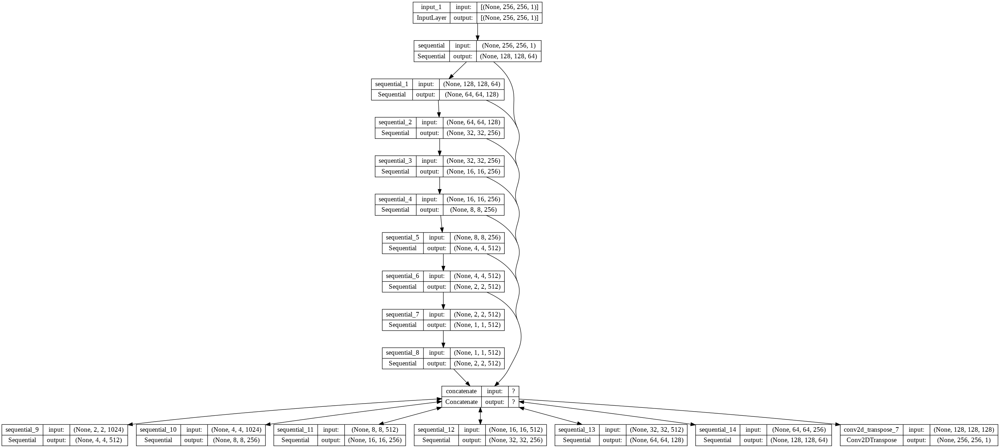

In [ ]:
# Visualizing the model tree for generator_g
plot_model(generator_g,
           to_file = 'generator_g_model.png', 
           show_shapes = True, 
           show_layer_names = True)

In [ ]:
# Viewing generator_f model summary
generator_f.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 256, 256, 1  0           []                               
                                )]                                                                
                                                                                                  
 sequential_15 (Sequential)     (None, 128, 128, 64  1024        ['input_2[0][0]']                
                                )                                                                 
                                                                                                  
 sequential_16 (Sequential)     (None, 64, 64, 128)  131072      ['sequential_15[0][0]']          
                                                                                            

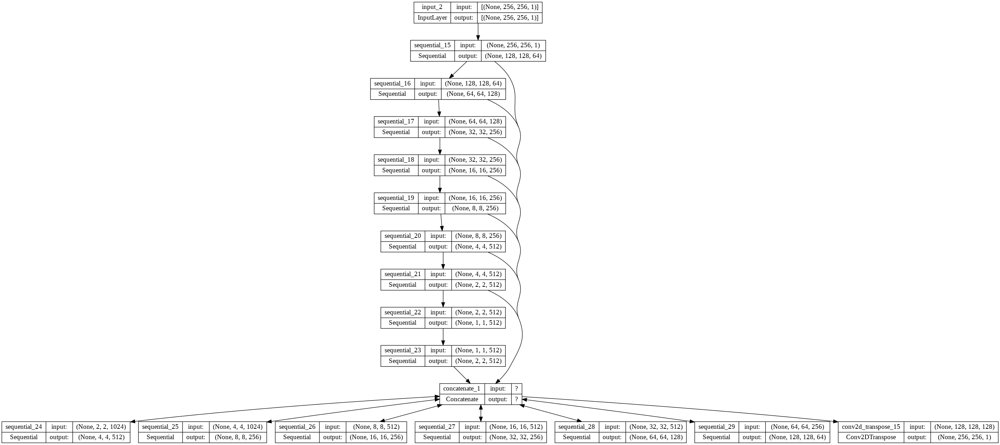

In [ ]:
# Visualizing the model tree for generator_f
plot_model(generator_f,
           to_file = 'generator_f_model.png', 
           show_shapes = True, 
           show_layer_names = True)

## 4e. Discriminator Building

In [ ]:
# Discriminators are image classifiers
# Discriminators contain only Convolutional Layers and no Transposed Convolutional layers
# Discriminator has only downsampling layers

In [ ]:
# Defining a function for Discriminator Model

def discriminator():
  initializer = tf.random_normal_initializer(0., 0.02)
  
  #Adding input layer of size (resize_dim_1, resize_dim_2,1)
  inp = tf.keras.layers.Input(shape = [resize_dim_1, resize_dim_2, 1], 
                              name = 'input_image')
  x = inp
  
  #Adding downsampling step
  down1 = downsample(64, 4, False)(x) #I/P: (bs, 256, 256, 1), bs: batch_size; O/P: (bs, 128, 128, 64)
  down2 = downsample(128, 4)(down1) #O/P: (bs, 64, 64, 128)
  down3 = downsample(256, 4)(down2) #O/P: (bs, 32, 32, 256)
  #Adding a padding (zero) layer
  zero_pad1 = tf.keras.layers.ZeroPadding2D()(down3) #O/P: (bs, 34, 34, 256)
  
  #Implementing a concrete downsampling layer
  conv = tf.keras.layers.Conv2D(512, 4, 
                                strides = 1, 
                                kernel_initializer = initializer, 
                                use_bias = False)(zero_pad1) #I/P: (bs, 34, 34, 256), bs: batch_size; O/P: (bs, 31, 31, 512)
  norm1 = InstanceNormalization()(conv) #Applying instance normalization
  leaky_relu = tf.keras.layers.LeakyReLU()(norm1) #Applying activation

  #Applying zero padding layer
  zero_pad2 = tf.keras.layers.ZeroPadding2D()(leaky_relu) #O/P: (bs, 33, 33, 512)
  
  #Add a last pure 2D convolution layer
  last = tf.keras.layers.Conv2D(1, 4, strides = 1, kernel_initializer = initializer)(zero_pad2) #O/P: (bs, 30, 30, 1)

  return tf.keras.Model(inputs = inp, outputs = last)

In [ ]:
# Instantiating the Discriminator Neural Networks

# Instantiating Discriminator X: In domain X (T1)
discriminator_x = discriminator()

# Instantiating Discriminator Y: In domain Y (T2)
discriminator_y = discriminator()

In [ ]:
# Viewing discriminator_x model summary
discriminator_x.summary()

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_image (InputLayer)    [(None, 256, 256, 1)]     0         
                                                                 
 sequential_30 (Sequential)  (None, 128, 128, 64)      1024      
                                                                 
 sequential_31 (Sequential)  (None, 64, 64, 128)       131072    
                                                                 
 sequential_32 (Sequential)  (None, 32, 32, 256)       524288    
                                                                 
 zero_padding2d (ZeroPadding  (None, 34, 34, 256)      0         
 2D)                                                             
                                                                 
 conv2d_19 (Conv2D)          (None, 31, 31, 512)       2097152   
                                                           

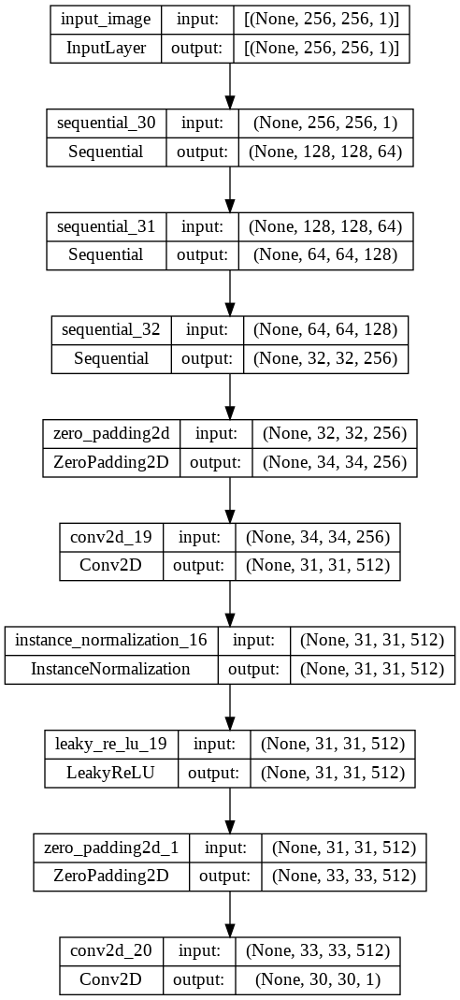

In [ ]:
# Visualizing the model tree for discriminator_x
plot_model(discriminator_x,
           to_file = 'discriminator_x_model.png',
           show_shapes = True, 
           show_layer_names = True)

In [ ]:
# Viewing discriminator_y model summary
discriminator_y.summary()

Model: "model_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_image (InputLayer)    [(None, 256, 256, 1)]     0         
                                                                 
 sequential_33 (Sequential)  (None, 128, 128, 64)      1024      
                                                                 
 sequential_34 (Sequential)  (None, 64, 64, 128)       131072    
                                                                 
 sequential_35 (Sequential)  (None, 32, 32, 256)       524288    
                                                                 
 zero_padding2d_2 (ZeroPaddi  (None, 34, 34, 256)      0         
 ng2D)                                                           
                                                                 
 conv2d_24 (Conv2D)          (None, 31, 31, 512)       2097152   
                                                           

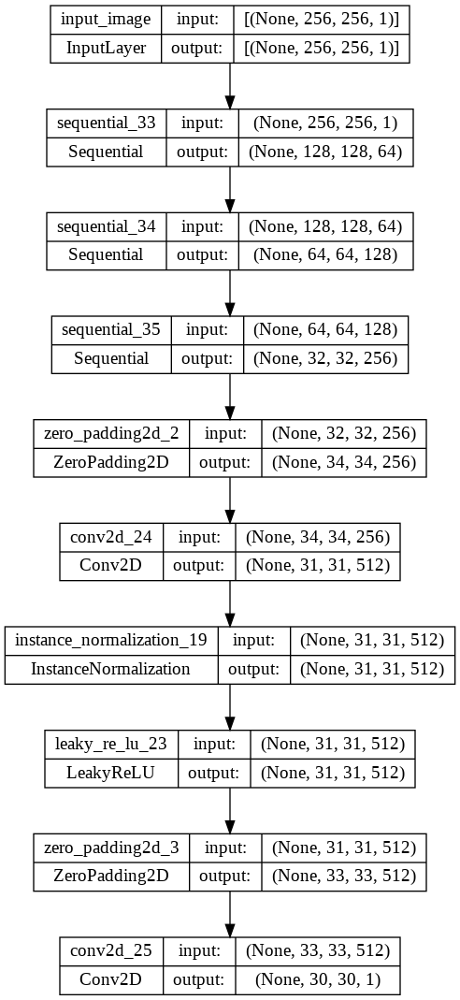

In [ ]:
# Visualizing the model tree for discriminator_y
plot_model(discriminator_y,
           to_file = 'discriminator_y_model.png', 
           show_shapes = True, 
           show_layer_names = True)

# 5. Model Training
5a. Declaring Loss Type <br>
5b. Calculating Discriminator Loss <br>
5c. Calculating Generator Loss <br>
5d. Calculating Cycle Consistency Loss <br>
5e. Calculating Identity Loss <br>
5f. Defining Optimizer <br>
5g. Checkpoint Initialization <br>
5h. Training Flow <br>

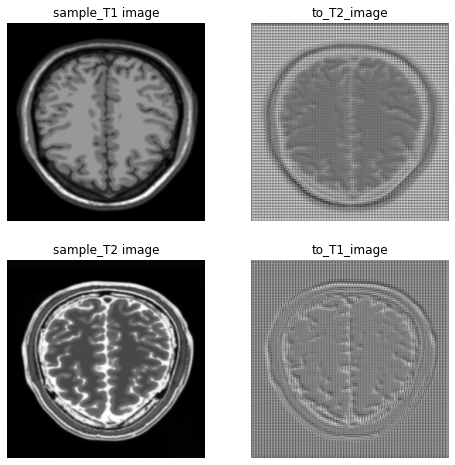

In [ ]:
# Checking output of the untrained generator models
# This should generate a random noise

to_T2_image = generator_g(sample_T1_train)
to_T1_image = generator_f(sample_T2_train)

imgs = [sample_T1_train, to_T2_image, 
        sample_T2_train, to_T1_image]
title = ['sample_T1 image', 'to_T2_image',
         'sample_T2 image', 'to_T1_image']

plt.figure(figsize = [8, 8])

for i in range(len(imgs)):
  plt.subplot(2, 2, i+1)
  plt.title(title[i])
  plt.imshow(imgs[i][0].numpy()[:, :, 0], cmap = 'gray')
  plt.axis('off')

plt.show()

## 5a. Declaring Loss Type

In [ ]:
# Since the discriminator is a classifier
# Loss shall be declared as Binary Cross Entropy loss

loss_func = tf.keras.losses.BinaryCrossentropy(from_logits = True) #logistic regression

## 5b. Calculating Discriminator Loss
<b>Discriminator losses</b>:
- Loss on Real data
- Loss on Fake/Generated data

In [ ]:
# Defining a function for discriminator loss

def discriminator_loss(real_data, fake_data):
  real_loss = loss_func(tf.ones_like(real_data), real_data) #Discriminator loss on real data (misclassification of real as fake)
  fake_loss = loss_func(tf.zeros_like(fake_data), fake_data) #Discriminator loss on fake data (misclassification of fake as real)
  total_disc_loss = real_loss + fake_loss #Total discriminator loss
  return total_disc_loss * 0.5 #weighted loss

## 5c. Calculating Generator Loss
- Loss on generated/fake data

In [ ]:
# Defining a function for generator loss

def generator_loss(fake_data):
   gg=loss_func(tf.ones_like(fake_data), fake_data) #no weights associated with loss
   return gg

## 5d. Calculating Cycle Consistency Loss
- Cycle Loss

In [ ]:
# Cycle loss: L1 distance between the real and the recycled image

In [ ]:
# Defining a function for cycle loss

def cycle_loss(real_image, cycled_image):
  #Pixel-wise difference between the real and cycled image is taken first
  #Then the absolute value of such difference is taken : L1 loss
  #tf.reduce_mean (computes mean of elements across dimensions of a tensor) takes the average of such losses
  cyc_loss = tf.reduce_mean(tf.abs(real_image - cycled_image))
  return 10.0 * cyc_loss #weighted loss

## 5e. Calculating Identity Loss
- There should be no difference between the real and the generated images if a real image of one domain is fed into the generator of the same domain

In [ ]:
# Identity loss is calculated (as L1 loss) by taking pixel-wise differences between the input and the output images

In [ ]:
# Defining a function for calculating identity loss
def identity_loss(real_image, same_image):
  id_loss = tf.reduce_mean(abs(real_image - same_image))
  return 0.5 * id_loss #weighted loss

## 5f. Defining Optimizer

In [ ]:
# Adam optimizer shall be used as it is suitable for quick learning

In [ ]:
# Initializing Adam optimizer

# For Generators
generator_g_optimizer = tf.keras.optimizers.Adam(2e-4, #learning rate (2e-4 = 0.0002)
                                                 beta_1 = 0.5 #exponential decay rate for 1st moment estimates
                                                 )

generator_f_optimizer = tf.keras.optimizers.Adam(2e-4,
                                                 beta_1 = 0.5)

# For Discriminators
discriminator_x_optimizer = tf.keras.optimizers.Adam(2e-4, 
                                                     beta_1 = 0.5)

discriminator_y_optimizer = tf.keras.optimizers.Adam(2e-4, 
                                                     beta_1 = 0.5)

## 5g. Checkpoint Initialization
- Checkpoints initialized to save models during training flow

In [ ]:
# Defining the Checkpoint path
checkpoint_path = './Trained_Model'

# Defining the Checkpoint
ckpt = tf.train.Checkpoint(generator_g = generator_g,
                           generator_f = generator_f,
                           discriminator_x = discriminator_x,
                           discriminator_y = discriminator_y,
                           generator_g_optimizer = generator_g_optimizer,
                           generator_f_optimizer = generator_f_optimizer,
                           discriminator_x_optimizer = discriminator_x_optimizer,
                           discriminator_y_optimizer = discriminator_y_optimizer)

# Setting the Checkpoint Manager
ckpt_manager = tf.train.CheckpointManager(ckpt, 
                                          checkpoint_path, 
                                          max_to_keep = 5)

# To restore the latest checkpoint if a checkpoint exists
if ckpt_manager.latest_checkpoint:
  ckpt.restore(ckpt_manager.latest_checkpoint)
  print('Latest checkpoint restored')

#Generating model for training

In [ ]:
# Function to show images output by the generators during training

def generate_images(model1, test_input1, model2, test_input2):
  #Make predictions out of generators G and F  
  prediction1 = model1(test_input1)
  prediction2 = model2(test_input2)

  #For viewing and saving images
  plt.figure(figsize = [8, 8])
  display_list = [test_input1[0], prediction1[0],
                  test_input2[0], prediction2[0]]
  title = ['Input Image-T1', 'Generated Image-T2',
           'Input Image-T2', 'Generated Image-T1']
  for i in range(4):
    plt.subplot(1, 4, i+1)
    plt.title(title[i])
    plt.imshow(display_list[i].numpy()[:, :, 0], cmap = 'gray')
    plt.axis('off')
  #For saving each epoch image in folder
  #plt.savefig('image_at_epoch_{:04d}.png'.format(epoch)) 
     
  plt.show()



## 5h. Training Flow
<b>Sequence of Training Flow:</b>
1. Generate Fake Y and Cycled X
2. Generate Fake X and Cycled Y
3. Generate Fake images through Generators G and F for Identity Loss
4. Calculate Discriminator Loss for Discriminator X and Discriminator Y on Fake Data for generator training
5. Calculate Generator Loss on Discriminator
6. Calculate Cycled Loss on Cycled Images from step 1 and 2
7. Calculate Total Generator Loss - Discriminator Loss + Cycle Loss + Identity Loss
8. Calculate Discriminator Loss on both Fake and Real images for Discriminator X and Discriminator Y for Discriminator Training
9. Calculate the Gradients and update the weights and biases of models (model parameters)

In [ ]:
# Identity and Cycle losses are used for training generators only, and not discriminators

In [ ]:
# Defining a function for training a single batch of data

@tf.function
def train_step(real_x, real_y):
  with tf.GradientTape(persistent = True) as tape:
    #Persistent = True because tape is used more than once to calculate the gradients
    #Generator G translates from X to Y
    #Generator F translates from Y to X
    fake_y = generator_g(real_x, training = True)
    cycled_x = generator_f(fake_y, training = True)

    fake_x = generator_f(real_y, training = True)
    cycled_y = generator_g(fake_x, training = True)

    #Generating same_x and same_y to calculate identity loss
    same_x = generator_f(real_x, training = True)
    same_y = generator_g(real_y, training = True)

    #Finding discriminator predictions on real and fake data
    disc_real_x = discriminator_x(real_x, training = True)
    disc_real_y = discriminator_y(real_y, training = True)

    disc_fake_x = discriminator_x(fake_x, training = True)
    disc_fake_y = discriminator_y(fake_y, training = True)

    #Calculating losses
    #Calculating loss on generators
    gen_g_loss = generator_loss(disc_fake_y)
    gen_f_loss = generator_loss(disc_fake_x)

    #Calculating total cycle loss
    total_cycle_loss = cycle_loss(real_x, cycled_x) + cycle_loss(real_y, cycled_y)

    #Calculating the total generator loss
    #Total generator loss = BCE loss + cycle loss + identity loss
    total_gen_g_loss = gen_g_loss + total_cycle_loss + identity_loss(real_y, same_y)
    total_gen_f_loss = gen_f_loss + total_cycle_loss + identity_loss(real_x, same_x)

    #Discriminator losses
    disc_x_loss = discriminator_loss(disc_real_x, disc_fake_x)
    disc_y_loss = discriminator_loss(disc_real_y, disc_fake_y)

  #Calculating gradients for generator and discriminator
  generator_g_gradients = tape.gradient(total_gen_g_loss, 
                                        generator_g.trainable_variables)
  generator_f_gradients = tape.gradient(total_gen_f_loss,
                                        generator_f.trainable_variables)
  
  discriminator_x_gradients = tape.gradient(disc_x_loss, 
                                            discriminator_x.trainable_variables)
  discriminator_y_gradients = tape.gradient(disc_y_loss,
                                            discriminator_y.trainable_variables)
  
  #Applying gradients to optimizer
  generator_g_optimizer.apply_gradients(zip(generator_g_gradients,
                                            generator_g.trainable_variables))
  generator_f_optimizer.apply_gradients(zip(generator_f_gradients,
                                            generator_f.trainable_variables))
  
  discriminator_x_optimizer.apply_gradients(zip(discriminator_x_gradients,
                                                discriminator_x.trainable_variables))
  discriminator_y_optimizer.apply_gradients(zip(discriminator_y_gradients,
                                                discriminator_y.trainable_variables))

<b>Training the CycleGAN models for specified number of epochs</b>

In [ ]:
# Setting number of epochs for model training
num_epochs = 100

# 6. Visualizing Style Transfer 

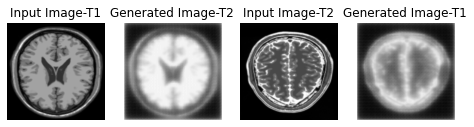

Saving checkpoint for epoch 1 at ./Trained_Model/ckpt-1
losses Cyclic consistancy loss: 3.76
identity_loss: 0.19
discriminator_loss: 0.74
generator_loss: 0.96


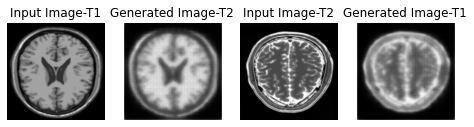

Saving checkpoint for epoch 2 at ./Trained_Model/ckpt-2
losses Cyclic consistancy loss: 3.50
identity_loss: 0.18
discriminator_loss: 0.78
generator_loss: 0.96


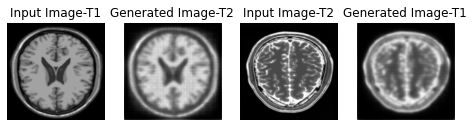

Saving checkpoint for epoch 3 at ./Trained_Model/ckpt-3
losses Cyclic consistancy loss: 3.63
identity_loss: 0.18
discriminator_loss: 0.74
generator_loss: 0.92


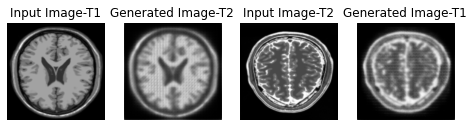

Saving checkpoint for epoch 4 at ./Trained_Model/ckpt-4
losses Cyclic consistancy loss: 3.90
identity_loss: 0.20
discriminator_loss: 0.75
generator_loss: 0.94


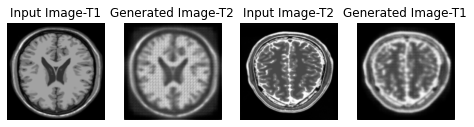

Saving checkpoint for epoch 5 at ./Trained_Model/ckpt-5
losses Cyclic consistancy loss: 3.83
identity_loss: 0.19
discriminator_loss: 0.74
generator_loss: 0.92


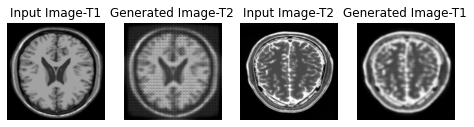

Saving checkpoint for epoch 6 at ./Trained_Model/ckpt-6
losses Cyclic consistancy loss: 4.00
identity_loss: 0.20
discriminator_loss: 0.78
generator_loss: 0.93


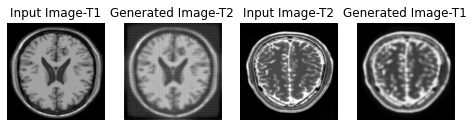

Saving checkpoint for epoch 7 at ./Trained_Model/ckpt-7
losses Cyclic consistancy loss: 3.54
identity_loss: 0.18
discriminator_loss: 0.77
generator_loss: 0.96


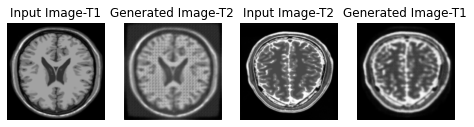

Saving checkpoint for epoch 8 at ./Trained_Model/ckpt-8
losses Cyclic consistancy loss: 3.88
identity_loss: 0.19
discriminator_loss: 0.74
generator_loss: 0.92


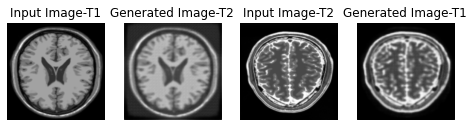

Saving checkpoint for epoch 9 at ./Trained_Model/ckpt-9
losses Cyclic consistancy loss: 3.77
identity_loss: 0.19
discriminator_loss: 0.73
generator_loss: 0.95


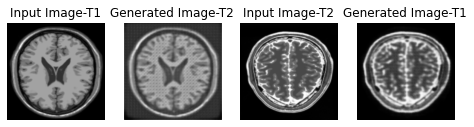

Saving checkpoint for epoch 10 at ./Trained_Model/ckpt-10
losses Cyclic consistancy loss: 3.57
identity_loss: 0.18
discriminator_loss: 0.73
generator_loss: 0.96


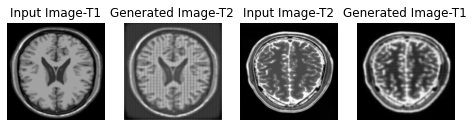

Saving checkpoint for epoch 11 at ./Trained_Model/ckpt-11
losses Cyclic consistancy loss: 3.55
identity_loss: 0.18
discriminator_loss: 0.74
generator_loss: 0.92


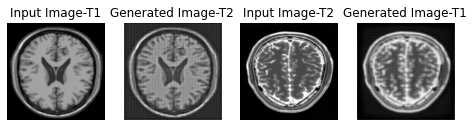

Saving checkpoint for epoch 12 at ./Trained_Model/ckpt-12
losses Cyclic consistancy loss: 3.74
identity_loss: 0.19
discriminator_loss: 0.73
generator_loss: 0.96


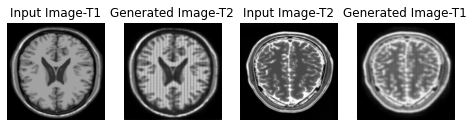

Saving checkpoint for epoch 13 at ./Trained_Model/ckpt-13
losses Cyclic consistancy loss: 3.41
identity_loss: 0.17
discriminator_loss: 0.78
generator_loss: 0.98


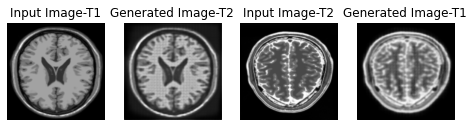

Saving checkpoint for epoch 14 at ./Trained_Model/ckpt-14
losses Cyclic consistancy loss: 3.87
identity_loss: 0.19
discriminator_loss: 0.74
generator_loss: 0.92


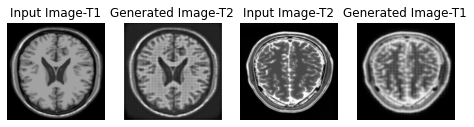

Saving checkpoint for epoch 15 at ./Trained_Model/ckpt-15
losses Cyclic consistancy loss: 3.30
identity_loss: 0.16
discriminator_loss: 0.76
generator_loss: 0.98


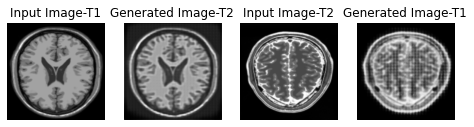

Saving checkpoint for epoch 16 at ./Trained_Model/ckpt-16
losses Cyclic consistancy loss: 3.89
identity_loss: 0.19
discriminator_loss: 0.77
generator_loss: 0.93


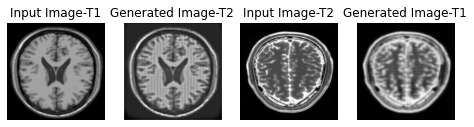

Saving checkpoint for epoch 17 at ./Trained_Model/ckpt-17
losses Cyclic consistancy loss: 3.68
identity_loss: 0.18
discriminator_loss: 0.73
generator_loss: 0.94


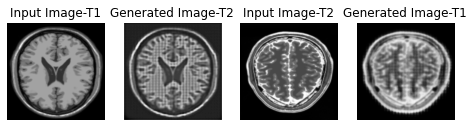

Saving checkpoint for epoch 18 at ./Trained_Model/ckpt-18
losses Cyclic consistancy loss: 3.90
identity_loss: 0.20
discriminator_loss: 0.77
generator_loss: 0.93


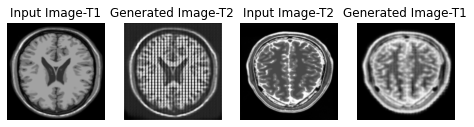

Saving checkpoint for epoch 19 at ./Trained_Model/ckpt-19
losses Cyclic consistancy loss: 4.01
identity_loss: 0.20
discriminator_loss: 0.75
generator_loss: 0.93


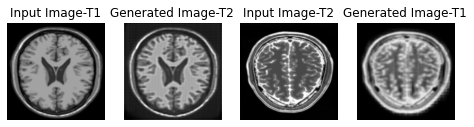

Saving checkpoint for epoch 20 at ./Trained_Model/ckpt-20
losses Cyclic consistancy loss: 3.35
identity_loss: 0.17
discriminator_loss: 0.73
generator_loss: 0.94


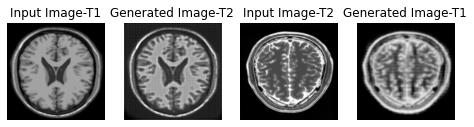

Saving checkpoint for epoch 21 at ./Trained_Model/ckpt-21
losses Cyclic consistancy loss: 3.93
identity_loss: 0.20
discriminator_loss: 0.74
generator_loss: 0.92


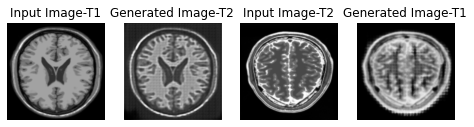

Saving checkpoint for epoch 22 at ./Trained_Model/ckpt-22
losses Cyclic consistancy loss: 3.10
identity_loss: 0.16
discriminator_loss: 0.77
generator_loss: 0.99


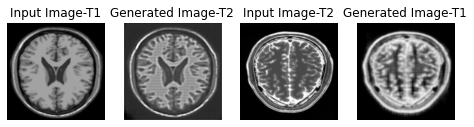

Saving checkpoint for epoch 23 at ./Trained_Model/ckpt-23
losses Cyclic consistancy loss: 4.11
identity_loss: 0.21
discriminator_loss: 0.78
generator_loss: 0.92


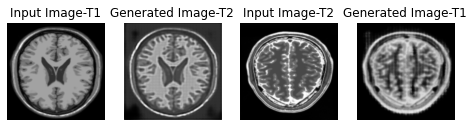

Saving checkpoint for epoch 24 at ./Trained_Model/ckpt-24
losses Cyclic consistancy loss: 4.07
identity_loss: 0.20
discriminator_loss: 0.78
generator_loss: 0.92


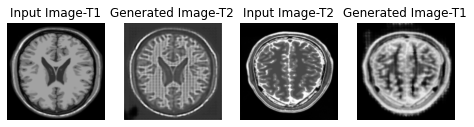

Saving checkpoint for epoch 25 at ./Trained_Model/ckpt-25
losses Cyclic consistancy loss: 3.70
identity_loss: 0.19
discriminator_loss: 0.77
generator_loss: 0.95


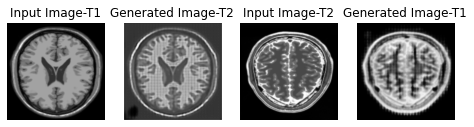

Saving checkpoint for epoch 26 at ./Trained_Model/ckpt-26
losses Cyclic consistancy loss: 4.12
identity_loss: 0.21
discriminator_loss: 0.78
generator_loss: 0.92


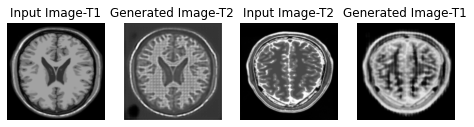

Saving checkpoint for epoch 27 at ./Trained_Model/ckpt-27
losses Cyclic consistancy loss: 3.42
identity_loss: 0.17
discriminator_loss: 0.77
generator_loss: 0.95


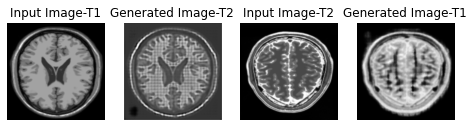

Saving checkpoint for epoch 28 at ./Trained_Model/ckpt-28
losses Cyclic consistancy loss: 3.97
identity_loss: 0.20
discriminator_loss: 0.80
generator_loss: 0.94


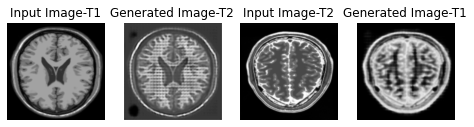

Saving checkpoint for epoch 29 at ./Trained_Model/ckpt-29
losses Cyclic consistancy loss: 3.85
identity_loss: 0.19
discriminator_loss: 0.77
generator_loss: 0.94


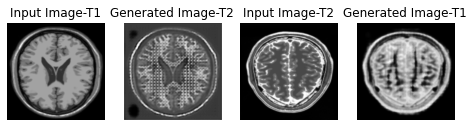

Saving checkpoint for epoch 30 at ./Trained_Model/ckpt-30
losses Cyclic consistancy loss: 4.07
identity_loss: 0.20
discriminator_loss: 0.80
generator_loss: 0.93


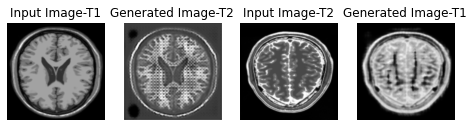

Saving checkpoint for epoch 31 at ./Trained_Model/ckpt-31
losses Cyclic consistancy loss: 3.69
identity_loss: 0.18
discriminator_loss: 0.74
generator_loss: 0.95


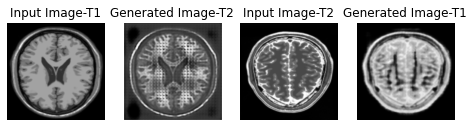

Saving checkpoint for epoch 32 at ./Trained_Model/ckpt-32
losses Cyclic consistancy loss: 3.37
identity_loss: 0.17
discriminator_loss: 0.77
generator_loss: 0.98


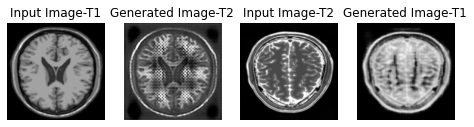

Saving checkpoint for epoch 33 at ./Trained_Model/ckpt-33
losses Cyclic consistancy loss: 3.97
identity_loss: 0.20
discriminator_loss: 0.79
generator_loss: 0.93


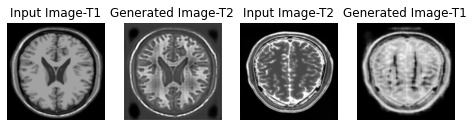

Saving checkpoint for epoch 34 at ./Trained_Model/ckpt-34
losses Cyclic consistancy loss: 3.80
identity_loss: 0.19
discriminator_loss: 0.74
generator_loss: 0.96


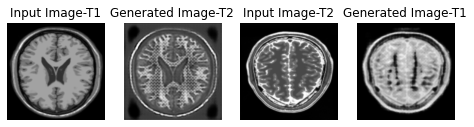

Saving checkpoint for epoch 35 at ./Trained_Model/ckpt-35
losses Cyclic consistancy loss: 3.73
identity_loss: 0.19
discriminator_loss: 0.73
generator_loss: 0.95


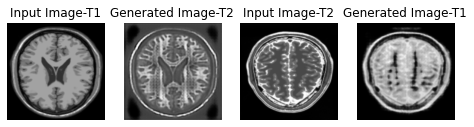

Saving checkpoint for epoch 36 at ./Trained_Model/ckpt-36
losses Cyclic consistancy loss: 3.51
identity_loss: 0.18
discriminator_loss: 0.73
generator_loss: 0.96


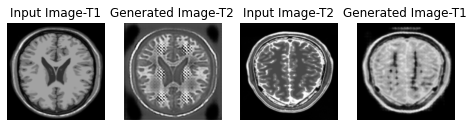

Saving checkpoint for epoch 37 at ./Trained_Model/ckpt-37
losses Cyclic consistancy loss: 4.00
identity_loss: 0.20
discriminator_loss: 0.74
generator_loss: 0.92


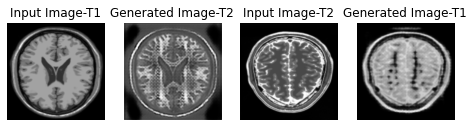

Saving checkpoint for epoch 38 at ./Trained_Model/ckpt-38
losses Cyclic consistancy loss: 3.55
identity_loss: 0.18
discriminator_loss: 0.74
generator_loss: 0.92


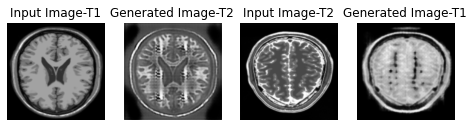

Saving checkpoint for epoch 39 at ./Trained_Model/ckpt-39
losses Cyclic consistancy loss: 3.81
identity_loss: 0.19
discriminator_loss: 0.74
generator_loss: 0.92


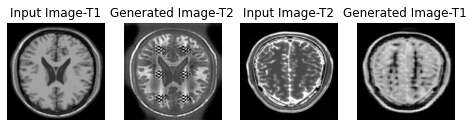

Saving checkpoint for epoch 40 at ./Trained_Model/ckpt-40
losses Cyclic consistancy loss: 4.00
identity_loss: 0.20
discriminator_loss: 0.79
generator_loss: 0.93


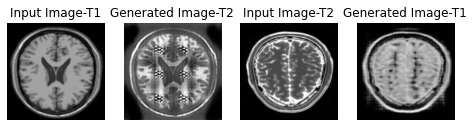

Saving checkpoint for epoch 41 at ./Trained_Model/ckpt-41
losses Cyclic consistancy loss: 3.27
identity_loss: 0.16
discriminator_loss: 0.74
generator_loss: 0.98


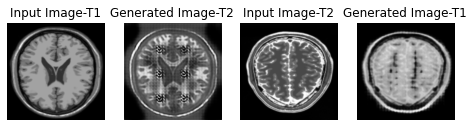

Saving checkpoint for epoch 42 at ./Trained_Model/ckpt-42
losses Cyclic consistancy loss: 3.94
identity_loss: 0.20
discriminator_loss: 0.78
generator_loss: 0.94


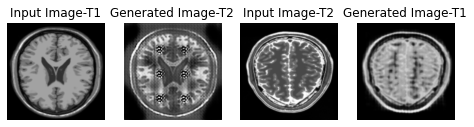

Saving checkpoint for epoch 43 at ./Trained_Model/ckpt-43
losses Cyclic consistancy loss: 3.67
identity_loss: 0.18
discriminator_loss: 0.75
generator_loss: 0.95


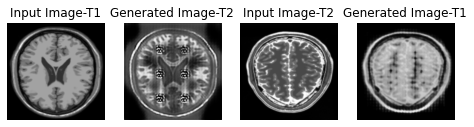

Saving checkpoint for epoch 44 at ./Trained_Model/ckpt-44
losses Cyclic consistancy loss: 3.59
identity_loss: 0.18
discriminator_loss: 0.73
generator_loss: 0.95


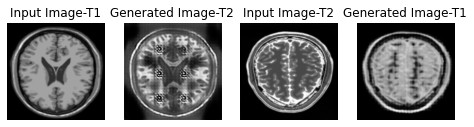

Saving checkpoint for epoch 45 at ./Trained_Model/ckpt-45
losses Cyclic consistancy loss: 3.94
identity_loss: 0.20
discriminator_loss: 0.77
generator_loss: 0.93


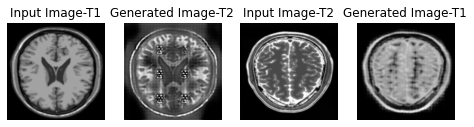

Saving checkpoint for epoch 46 at ./Trained_Model/ckpt-46
losses Cyclic consistancy loss: 3.88
identity_loss: 0.19
discriminator_loss: 0.74
generator_loss: 0.92


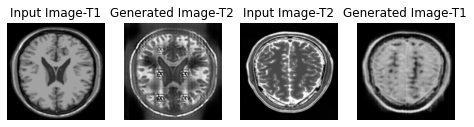

Saving checkpoint for epoch 47 at ./Trained_Model/ckpt-47
losses Cyclic consistancy loss: 4.00
identity_loss: 0.20
discriminator_loss: 0.78
generator_loss: 0.93


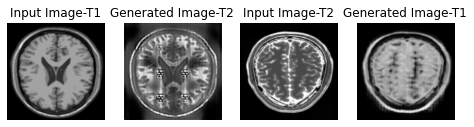

Saving checkpoint for epoch 48 at ./Trained_Model/ckpt-48
losses Cyclic consistancy loss: 3.59
identity_loss: 0.18
discriminator_loss: 0.74
generator_loss: 0.93


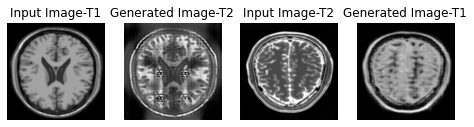

Saving checkpoint for epoch 49 at ./Trained_Model/ckpt-49
losses Cyclic consistancy loss: 3.40
identity_loss: 0.17
discriminator_loss: 0.74
generator_loss: 0.94


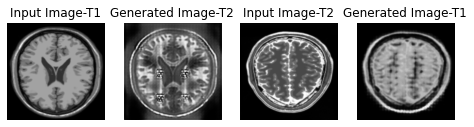

Saving checkpoint for epoch 50 at ./Trained_Model/ckpt-50
losses Cyclic consistancy loss: 3.50
identity_loss: 0.18
discriminator_loss: 0.73
generator_loss: 0.96


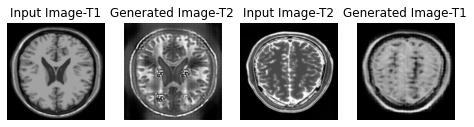

Saving checkpoint for epoch 51 at ./Trained_Model/ckpt-51
losses Cyclic consistancy loss: 3.41
identity_loss: 0.17
discriminator_loss: 0.77
generator_loss: 0.95


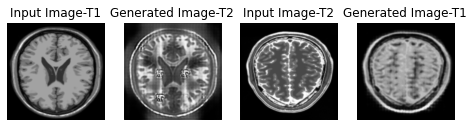

Saving checkpoint for epoch 52 at ./Trained_Model/ckpt-52
losses Cyclic consistancy loss: 3.50
identity_loss: 0.18
discriminator_loss: 0.73
generator_loss: 0.95


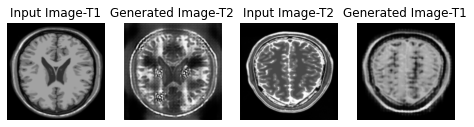

Saving checkpoint for epoch 53 at ./Trained_Model/ckpt-53
losses Cyclic consistancy loss: 4.14
identity_loss: 0.21
discriminator_loss: 0.79
generator_loss: 0.91


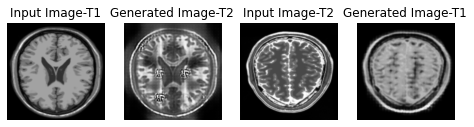

Saving checkpoint for epoch 54 at ./Trained_Model/ckpt-54
losses Cyclic consistancy loss: 3.71
identity_loss: 0.19
discriminator_loss: 0.78
generator_loss: 0.95


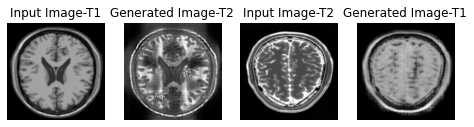

Saving checkpoint for epoch 55 at ./Trained_Model/ckpt-55
losses Cyclic consistancy loss: 3.62
identity_loss: 0.18
discriminator_loss: 0.72
generator_loss: 0.99


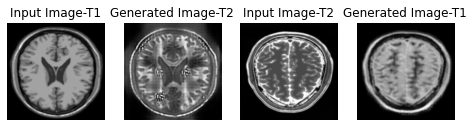

Saving checkpoint for epoch 56 at ./Trained_Model/ckpt-56
losses Cyclic consistancy loss: 3.69
identity_loss: 0.18
discriminator_loss: 0.73
generator_loss: 0.95


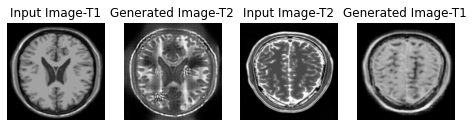

Saving checkpoint for epoch 57 at ./Trained_Model/ckpt-57
losses Cyclic consistancy loss: 3.78
identity_loss: 0.19
discriminator_loss: 0.79
generator_loss: 0.96


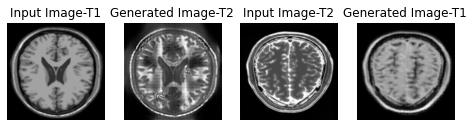

Saving checkpoint for epoch 58 at ./Trained_Model/ckpt-58
losses Cyclic consistancy loss: 3.58
identity_loss: 0.18
discriminator_loss: 0.74
generator_loss: 0.92


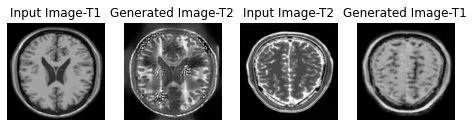

Saving checkpoint for epoch 59 at ./Trained_Model/ckpt-59
losses Cyclic consistancy loss: 3.42
identity_loss: 0.17
discriminator_loss: 0.77
generator_loss: 0.95


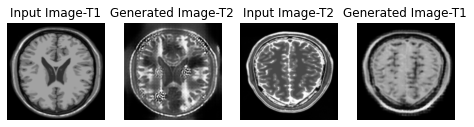

Saving checkpoint for epoch 60 at ./Trained_Model/ckpt-60
losses Cyclic consistancy loss: 3.93
identity_loss: 0.20
discriminator_loss: 0.75
generator_loss: 0.95


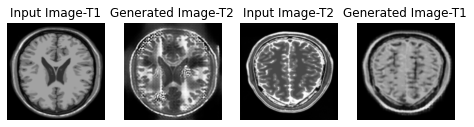

Saving checkpoint for epoch 61 at ./Trained_Model/ckpt-61
losses Cyclic consistancy loss: 3.69
identity_loss: 0.18
discriminator_loss: 0.79
generator_loss: 0.96


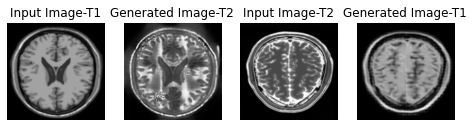

Saving checkpoint for epoch 62 at ./Trained_Model/ckpt-62
losses Cyclic consistancy loss: 4.02
identity_loss: 0.20
discriminator_loss: 0.74
generator_loss: 0.93


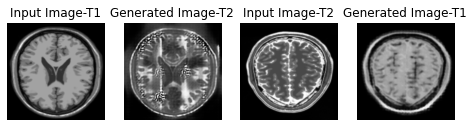

Saving checkpoint for epoch 63 at ./Trained_Model/ckpt-63
losses Cyclic consistancy loss: 3.59
identity_loss: 0.18
discriminator_loss: 0.73
generator_loss: 0.95


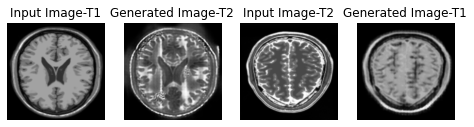

Saving checkpoint for epoch 64 at ./Trained_Model/ckpt-64
losses Cyclic consistancy loss: 3.41
identity_loss: 0.17
discriminator_loss: 0.77
generator_loss: 0.97


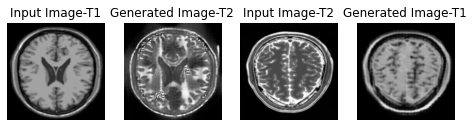

Saving checkpoint for epoch 65 at ./Trained_Model/ckpt-65
losses Cyclic consistancy loss: 4.01
identity_loss: 0.20
discriminator_loss: 0.78
generator_loss: 0.93


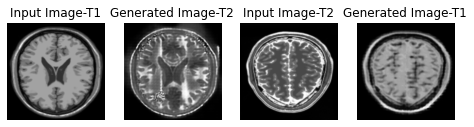

Saving checkpoint for epoch 66 at ./Trained_Model/ckpt-66
losses Cyclic consistancy loss: 3.53
identity_loss: 0.18
discriminator_loss: 0.74
generator_loss: 0.93


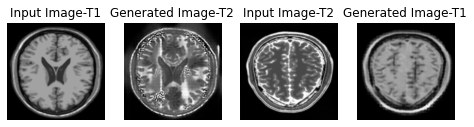

Saving checkpoint for epoch 67 at ./Trained_Model/ckpt-67
losses Cyclic consistancy loss: 3.98
identity_loss: 0.20
discriminator_loss: 0.79
generator_loss: 0.93


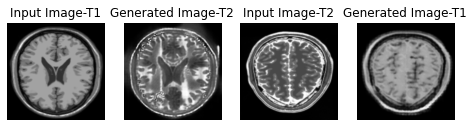

Saving checkpoint for epoch 68 at ./Trained_Model/ckpt-68
losses Cyclic consistancy loss: 4.02
identity_loss: 0.20
discriminator_loss: 0.78
generator_loss: 0.93


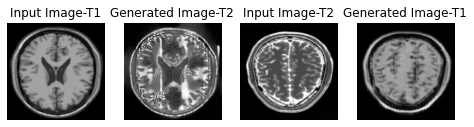

Saving checkpoint for epoch 69 at ./Trained_Model/ckpt-69
losses Cyclic consistancy loss: 3.35
identity_loss: 0.17
discriminator_loss: 0.74
generator_loss: 0.98


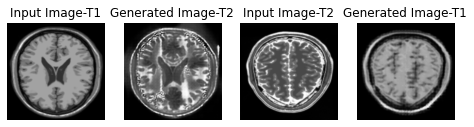

Saving checkpoint for epoch 70 at ./Trained_Model/ckpt-70
losses Cyclic consistancy loss: 3.71
identity_loss: 0.19
discriminator_loss: 0.74
generator_loss: 0.93


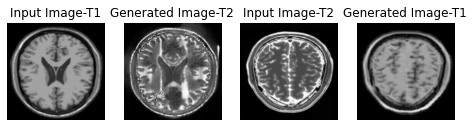

Saving checkpoint for epoch 71 at ./Trained_Model/ckpt-71
losses Cyclic consistancy loss: 3.51
identity_loss: 0.18
discriminator_loss: 0.73
generator_loss: 0.96


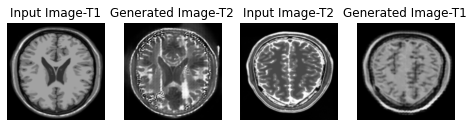

Saving checkpoint for epoch 72 at ./Trained_Model/ckpt-72
losses Cyclic consistancy loss: 3.46
identity_loss: 0.17
discriminator_loss: 0.77
generator_loss: 0.96


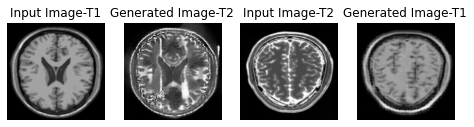

Saving checkpoint for epoch 73 at ./Trained_Model/ckpt-73
losses Cyclic consistancy loss: 3.82
identity_loss: 0.19
discriminator_loss: 0.75
generator_loss: 0.94


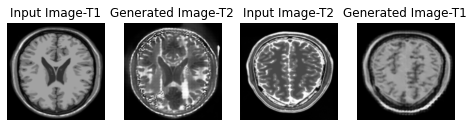

Saving checkpoint for epoch 74 at ./Trained_Model/ckpt-74
losses Cyclic consistancy loss: 3.78
identity_loss: 0.19
discriminator_loss: 0.73
generator_loss: 0.96


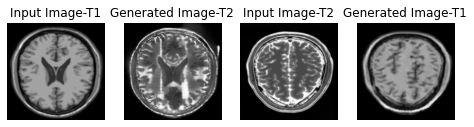

Saving checkpoint for epoch 75 at ./Trained_Model/ckpt-75
losses Cyclic consistancy loss: 2.85
identity_loss: 0.14
discriminator_loss: 0.76
generator_loss: 0.98


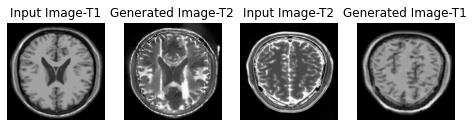

Saving checkpoint for epoch 76 at ./Trained_Model/ckpt-76
losses Cyclic consistancy loss: 3.79
identity_loss: 0.19
discriminator_loss: 0.74
generator_loss: 0.96


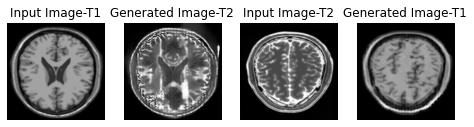

Saving checkpoint for epoch 77 at ./Trained_Model/ckpt-77
losses Cyclic consistancy loss: 3.75
identity_loss: 0.19
discriminator_loss: 0.74
generator_loss: 0.96


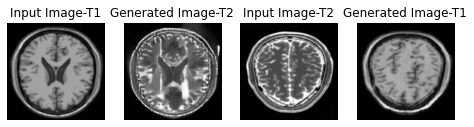

Saving checkpoint for epoch 78 at ./Trained_Model/ckpt-78
losses Cyclic consistancy loss: 3.94
identity_loss: 0.20
discriminator_loss: 0.77
generator_loss: 0.93


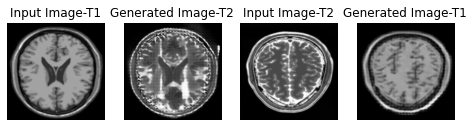

Saving checkpoint for epoch 79 at ./Trained_Model/ckpt-79
losses Cyclic consistancy loss: 3.42
identity_loss: 0.17
discriminator_loss: 0.77
generator_loss: 0.95


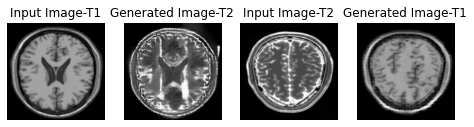

Saving checkpoint for epoch 80 at ./Trained_Model/ckpt-80
losses Cyclic consistancy loss: 4.11
identity_loss: 0.21
discriminator_loss: 0.79
generator_loss: 0.92


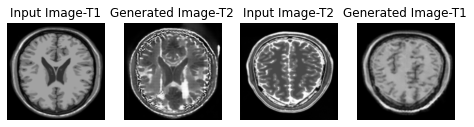

Saving checkpoint for epoch 81 at ./Trained_Model/ckpt-81
losses Cyclic consistancy loss: 3.42
identity_loss: 0.17
discriminator_loss: 0.78
generator_loss: 0.95


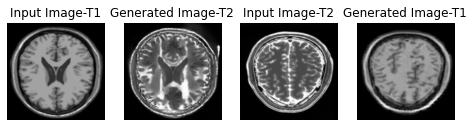

Saving checkpoint for epoch 82 at ./Trained_Model/ckpt-82
losses Cyclic consistancy loss: 3.55
identity_loss: 0.18
discriminator_loss: 0.72
generator_loss: 0.98


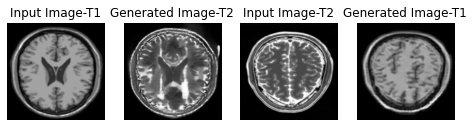

Saving checkpoint for epoch 83 at ./Trained_Model/ckpt-83
losses Cyclic consistancy loss: 3.33
identity_loss: 0.17
discriminator_loss: 0.73
generator_loss: 0.94


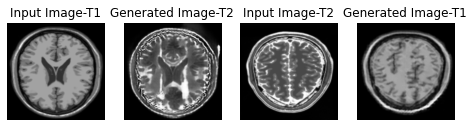

Saving checkpoint for epoch 84 at ./Trained_Model/ckpt-84
losses Cyclic consistancy loss: 3.67
identity_loss: 0.18
discriminator_loss: 0.73
generator_loss: 0.95


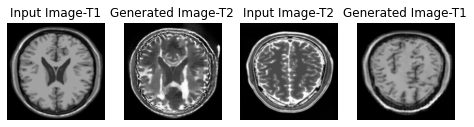

Saving checkpoint for epoch 85 at ./Trained_Model/ckpt-85
losses Cyclic consistancy loss: 3.88
identity_loss: 0.19
discriminator_loss: 0.73
generator_loss: 0.96


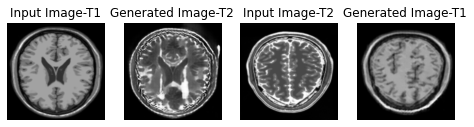

Saving checkpoint for epoch 86 at ./Trained_Model/ckpt-86
losses Cyclic consistancy loss: 3.40
identity_loss: 0.17
discriminator_loss: 0.77
generator_loss: 0.97


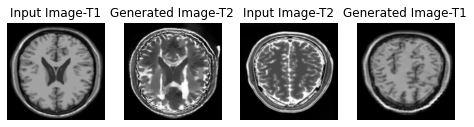

Saving checkpoint for epoch 87 at ./Trained_Model/ckpt-87
losses Cyclic consistancy loss: 3.76
identity_loss: 0.19
discriminator_loss: 0.74
generator_loss: 0.96


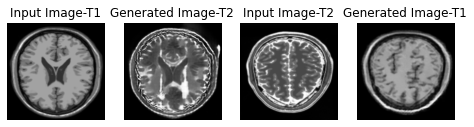

Saving checkpoint for epoch 88 at ./Trained_Model/ckpt-88
losses Cyclic consistancy loss: 3.72
identity_loss: 0.19
discriminator_loss: 0.73
generator_loss: 0.94


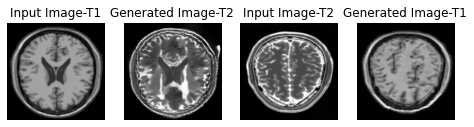

Saving checkpoint for epoch 89 at ./Trained_Model/ckpt-89
losses Cyclic consistancy loss: 4.12
identity_loss: 0.21
discriminator_loss: 0.78
generator_loss: 0.92


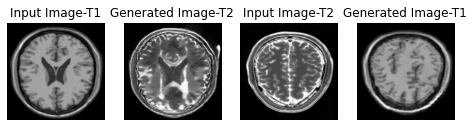

Saving checkpoint for epoch 90 at ./Trained_Model/ckpt-90
losses Cyclic consistancy loss: 3.75
identity_loss: 0.19
discriminator_loss: 0.73
generator_loss: 0.96


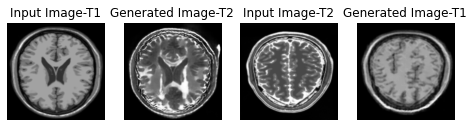

Saving checkpoint for epoch 91 at ./Trained_Model/ckpt-91
losses Cyclic consistancy loss: 3.85
identity_loss: 0.19
discriminator_loss: 0.75
generator_loss: 0.93


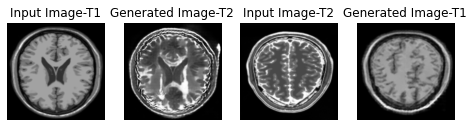

Saving checkpoint for epoch 92 at ./Trained_Model/ckpt-92
losses Cyclic consistancy loss: 3.66
identity_loss: 0.18
discriminator_loss: 0.74
generator_loss: 0.96


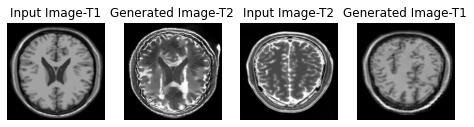

Saving checkpoint for epoch 93 at ./Trained_Model/ckpt-93
losses Cyclic consistancy loss: 4.00
identity_loss: 0.20
discriminator_loss: 0.79
generator_loss: 0.93


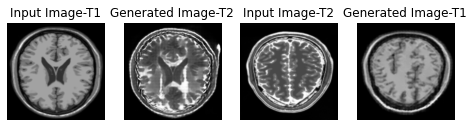

Saving checkpoint for epoch 94 at ./Trained_Model/ckpt-94
losses Cyclic consistancy loss: 3.90
identity_loss: 0.19
discriminator_loss: 0.75
generator_loss: 0.94


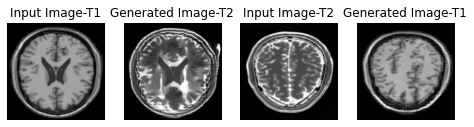

Saving checkpoint for epoch 95 at ./Trained_Model/ckpt-95
losses Cyclic consistancy loss: 3.64
identity_loss: 0.18
discriminator_loss: 0.78
generator_loss: 0.96


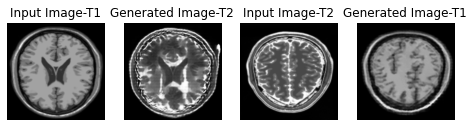

Saving checkpoint for epoch 96 at ./Trained_Model/ckpt-96
losses Cyclic consistancy loss: 3.90
identity_loss: 0.20
discriminator_loss: 0.74
generator_loss: 0.92


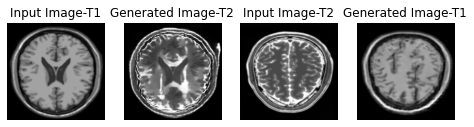

Saving checkpoint for epoch 97 at ./Trained_Model/ckpt-97
losses Cyclic consistancy loss: 4.02
identity_loss: 0.20
discriminator_loss: 0.79
generator_loss: 0.92


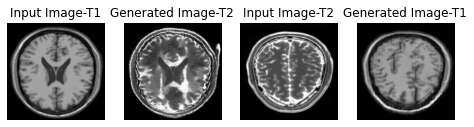

Saving checkpoint for epoch 98 at ./Trained_Model/ckpt-98
losses Cyclic consistancy loss: 3.89
identity_loss: 0.19
discriminator_loss: 0.74
generator_loss: 0.92


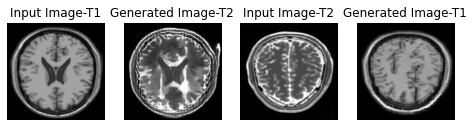

Saving checkpoint for epoch 99 at ./Trained_Model/ckpt-99
losses Cyclic consistancy loss: 3.72
identity_loss: 0.19
discriminator_loss: 0.73
generator_loss: 0.95


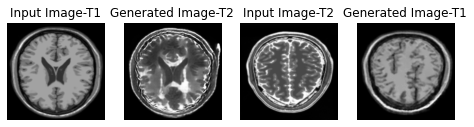

Saving checkpoint for epoch 100 at ./Trained_Model/ckpt-100
losses Cyclic consistancy loss: 3.67
identity_loss: 0.18
discriminator_loss: 0.73
generator_loss: 0.95


In [ ]:
from keras.utils.image_utils import save_img
# Calling the train_step function for model training over a specified number of epochs
import matplotlib.pyplot as plt
for epoch in range(1, num_epochs + 1):
  for image_x, image_y in tf.data.Dataset.zip((T1_train, T2_train)):
   train_step(image_x, image_y)
  generate_images(generator_g, sample_T1_train, 
                  generator_f, sample_T2_train)
  
  
  ckpt_save_path = ckpt_manager.save()
  print('Saving checkpoint for epoch', epoch,'at', ckpt_save_path)
                                                         
                                                   
  c=cycle_loss(image_x, image_y)
  i=identity_loss(image_x, image_y)
  d=discriminator_loss(image_x, image_y)
  g=generator_loss(image_y)

  print('losses','Cyclic consistancy loss: {:1.2f}'.format(c.numpy()))
  print('identity_loss: {:1.2f}'.format(i.numpy()))  
  print('discriminator_loss: {:1.2f}'.format(d.numpy())) 
  print('generator_loss: {:1.2f}'.format(g.numpy()))
  

# 7. Generating Image And Model Evaluating
- Generating images using the packaged model

In [ ]:
# Creating a function to take input image and provide generated image
from skimage.metrics import structural_similarity as ssim
from scipy import mean
from collections import OrderedDict
from math import log10, sqrt
import math 
def image_generator(input_image, generator):
  ##Pre-processing input image

  #Normalizing input between -1 and +1
  preprocess_inp = (input_image / 127.5) - 1
  
  #Resizing input image
  resize_dim_1 = 256
  resize_dim_2 = 256
  preprocess_inp = resize(preprocess_inp, (resize_dim_1, resize_dim_2))

  #Reshaping input image
  preprocess_inp = preprocess_inp.reshape(1, resize_dim_1, resize_dim_2, 1)

  #Converting datatype to float32
  preprocess_inp = preprocess_inp.astype('float32')

  ##Generating image out of preprocessed input using generator
  generated_image = generator(preprocess_inp)

  ##Post-processing output image

  #Converting output image from TF format to numpy array format
  postprocess_out = generated_image.numpy()

  #Reshaping output image
  postprocess_out = postprocess_out.reshape(resize_dim_1, resize_dim_2)

  #Resizing output image to dimensions of input image
  postprocess_out = resize(postprocess_out, (input_image.shape[0], 
                                             input_image.shape[1]))
  
  #De-normalizing output image
  postprocess_out = (postprocess_out + 1) * 127.5

  #Converting datatype of output image to that of input image
  postprocess_out = postprocess_out.astype(str(input_image.dtype))


  ##Visualizing results
  plt.figure(figsize = [16, 16])

  plt.subplot(1, 2, 1)
  plt.title('Original image')
  plt.imshow(input_image, cmap = 'gray')

  plt.subplot(1, 2, 2)
  plt.title('Generated image')
  plt.imshow(postprocess_out, cmap = 'gray')
  plt.savefig('generated image_{:04d}.png'.format(epoch))
  s = ssim(input_image, postprocess_out)
  plt.show()
  print('SSIM SCORE',s)
  mse = mean((input_image - postprocess_out) ** 2)
  max_pixel = 255.0
  psnr = 20 * log10(max_pixel / sqrt(mse))
  #db(decibles) to check the quality of image
  print('PSNR SCORE',psnr,'db')

#8. Generating Data By Providing Test dataset 

#8.1 Checking how the model generates T1 image when T1 image is provided

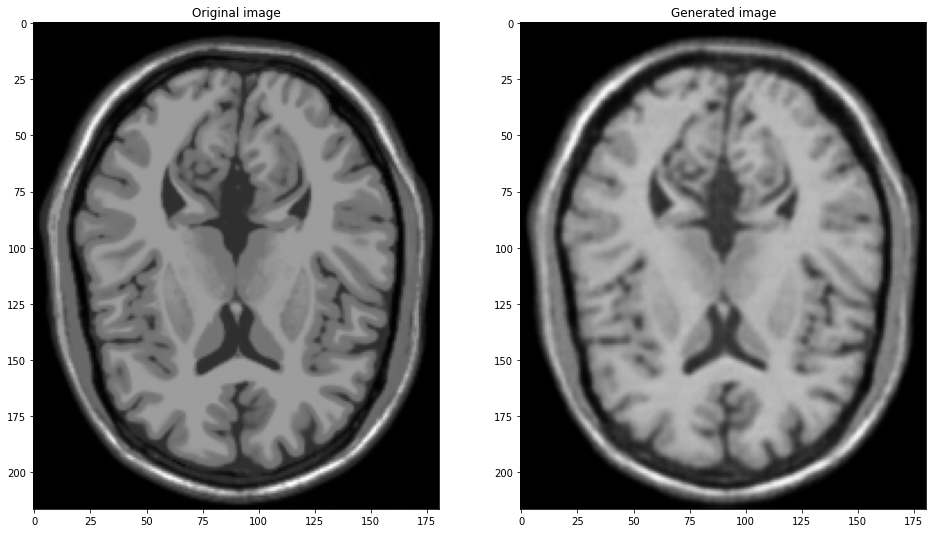

SSIM SCORE 0.9452549320399525
PSNR SCORE 33.096174626476234 db


<ipython-input-68-8ab8a5c212de>:60: DeprecationWarning: scipy.mean is deprecated and will be removed in SciPy 2.0.0, use numpy.mean instead
  mse = mean((input_image - postprocess_out) ** 2)


In [ ]:
# image_generator(input_image, generator)
image_generator(T1_teimages[0], generator_f)

#8.2 Checking how the model generates T2 image when T2 image is provided

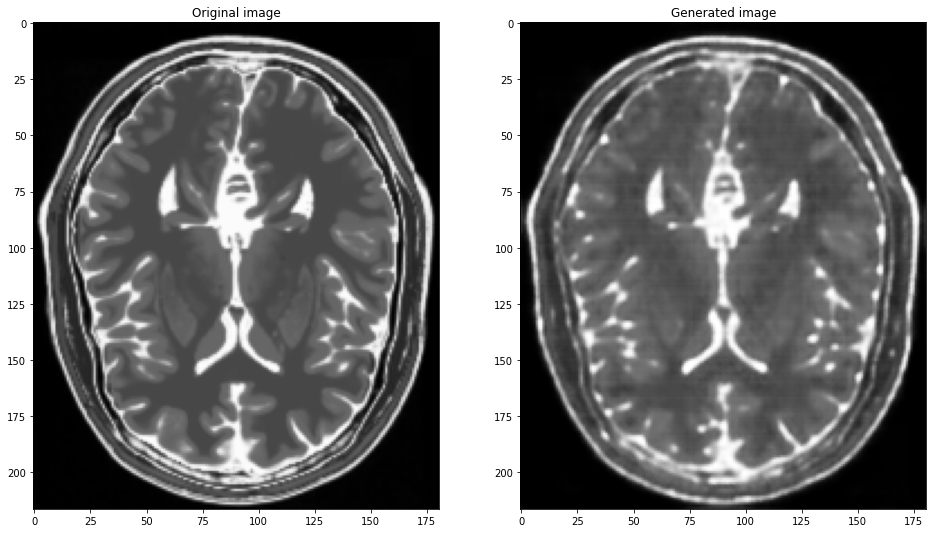

SSIM SCORE 0.8735776510823481
PSNR SCORE 30.729809130051855 db


<ipython-input-68-8ab8a5c212de>:60: DeprecationWarning: scipy.mean is deprecated and will be removed in SciPy 2.0.0, use numpy.mean instead
  mse = mean((input_image - postprocess_out) ** 2)


In [ ]:
# image_generator(input_image, generator)
image_generator(T2_teimages[0], generator_g)

#8.3 Checking how the model generates T2 image when T1 image is provided

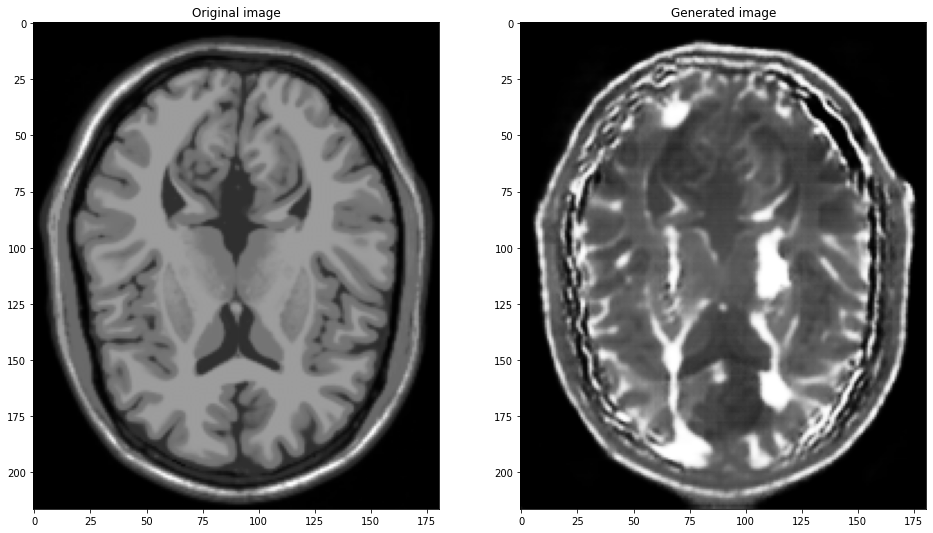

SSIM SCORE 0.5436783572872091
PSNR SCORE 29.01410826489611 db


<ipython-input-68-8ab8a5c212de>:60: DeprecationWarning: scipy.mean is deprecated and will be removed in SciPy 2.0.0, use numpy.mean instead
  mse = mean((input_image - postprocess_out) ** 2)


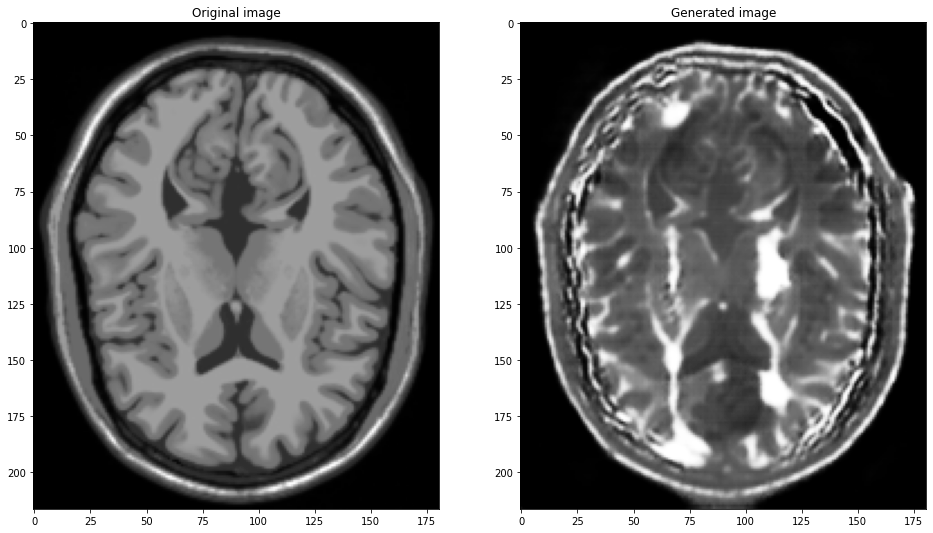

SSIM SCORE 0.5525328008602042
PSNR SCORE 29.031364672187298 db


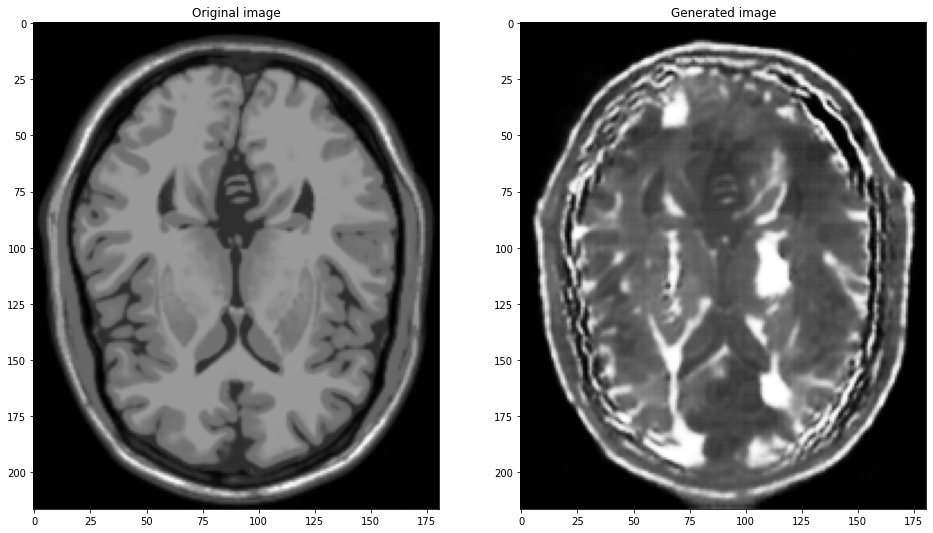

SSIM SCORE 0.5273922868259953
PSNR SCORE 29.005709252175215 db


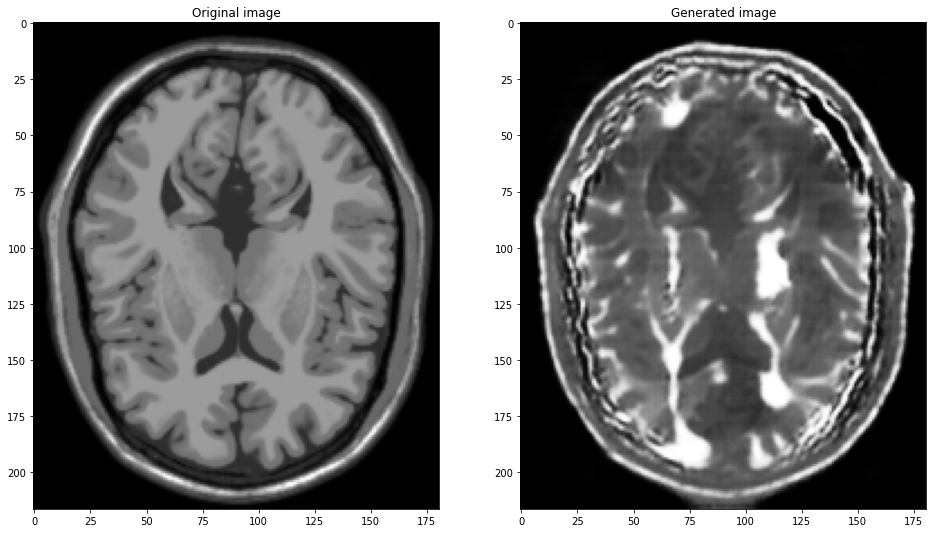

SSIM SCORE 0.5345487268411485
PSNR SCORE 29.043917184456525 db


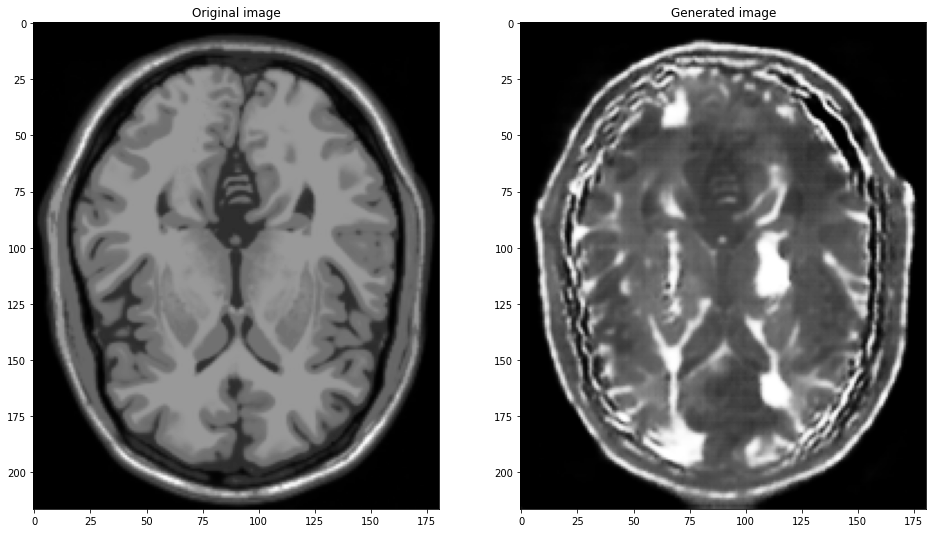

SSIM SCORE 0.5304534852990278
PSNR SCORE 29.01670815540792 db


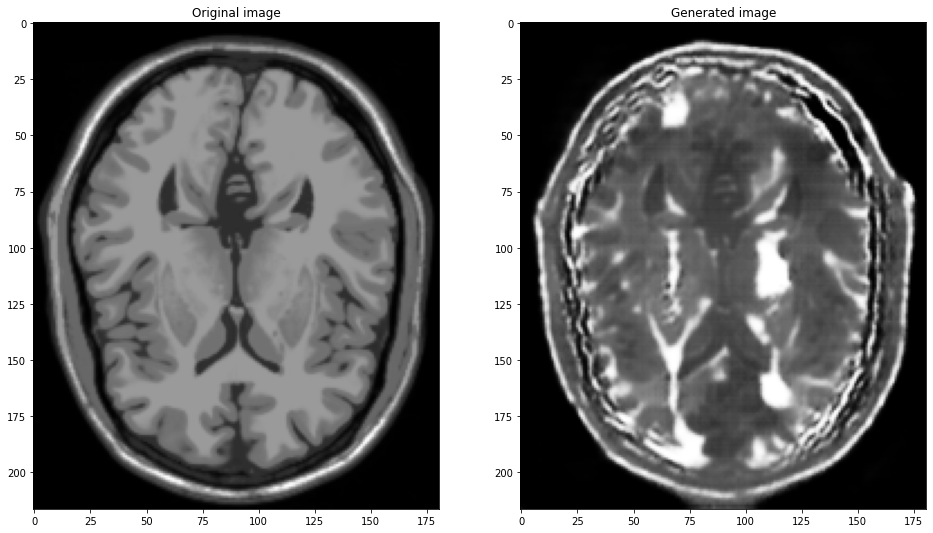

SSIM SCORE 0.525749755163405
PSNR SCORE 29.050310238607054 db


In [ ]:
# image_generator(input_image, generator)
for x in range(6):
   image_generator(T1_teimages[x], generator_g)
     


#8.4 Checking how the model generates T1 image when T2 image is provided

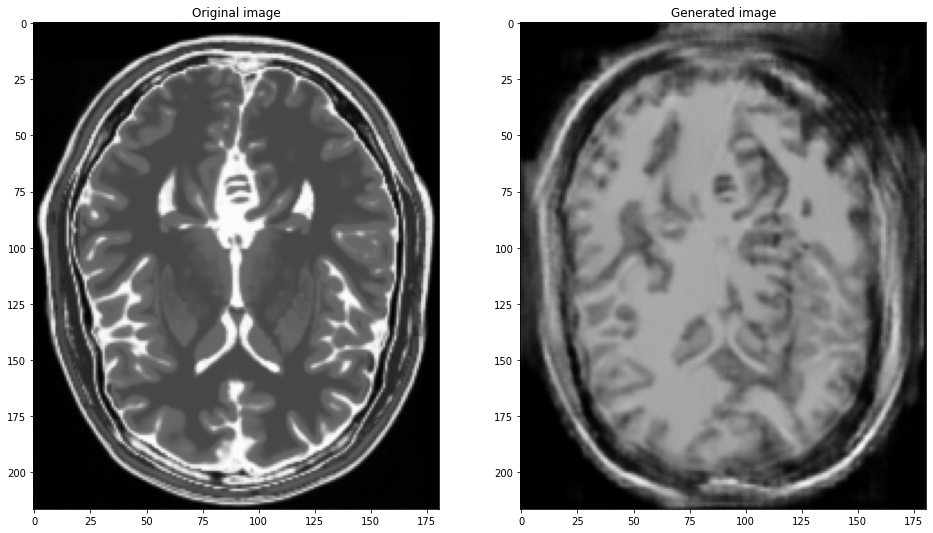

SSIM SCORE 0.3549764347872807
PSNR SCORE 28.48346249781667 db


<ipython-input-68-8ab8a5c212de>:60: DeprecationWarning: scipy.mean is deprecated and will be removed in SciPy 2.0.0, use numpy.mean instead
  mse = mean((input_image - postprocess_out) ** 2)


In [ ]:
# image_generator(input_image, generator)
image_generator(T2_teimages[2], generator_f)
